**EE 610 Assignment 4**



In [ ]:
#Adding the libraries

import matplotlib.pyplot as plt #For image plotting
from matplotlib import cm #Using colormaps in Matlab
from PIL import Image #For inline display of images only
from google.colab.patches import cv2_imshow #Inline image display in notebook
import numpy as np #Array operations
import cv2 #Image based operations
import os  #File operations in local directory
import glob #Match filepth for the expressions
import random as rand #Randomising data

#For Unet architecture implementation, import:
#Layers from tensorflow keras such as Maxpool, Dense, Conv2D....
import tensorflow as tf #Tensorflow for generating Neural net architecture
#from tensorflow.keras.layers import Activation, Dense, Dropout, Conv2D, Conv2DTranspose, MaxPooling2D, Concatenate, Input, Cropping2D, Flatten
from tensorflow.keras import Model #Neural net model
#Plot model for graphical visualisation of model architecture
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as B #Tensorflow backend fuctionbs
import pydot,graphviz #Plotting tool required by plot_model
from skimage.metrics import structural_similarity as ssim

In [ ]:
#Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Auxillary functions

#Function to generate relative path list for files of specific extension in directory
def listFiles(path,ext):
  flist=glob.glob(path+'*.'+ext) #List files matching extension in path
  flist.sort() #Sort the path list
  return flist

#Function to pad image ()default relect the cormers and edges
def imPad(img,width,mode='reflect'):
    if len(img.shape)==2:
        #For Grey scale image
        img_pad=np.pad(img, pad_width=((width, width), (width, width)), mode=mode) #Pad length and width
    elif len(img.shape)==3:
        #For Color image
        img_pad=np.pad(img, pad_width=((width, width), (width, width), (0, 0)), mode=mode) #Pad length and width
    return (img_pad)

#Ref: A survey of loss functions for semantic segmentation by Shruti Jadon
def DiceLoss(y_true, y_pred, smooth=1e-6):
    #flatten label and prediction tensors
    y_pred = B.flatten(y_pred) #Flattern to 1D Tensor of predicted value
    y_true = B.flatten(y_true) #Flattern to 1D Tensor of true value
    
    intersection = tf.reduce_sum(y_true*y_pred) #Compute the sum of multiplied tensors
    dice = (2*intersection + smooth) / (tf.reduce_sum(y_true) + B.sum(y_pred) + smooth) #Compute dice score
    #Loss=1-score
    return 1 - dice

#Compute diceScore
def diceScore(y_true, y_pred):
    #Score is 1-Loss
    return 1-DiceLoss(y_true, y_pred)

def dice(y_pred,y_true):
  #Array based dice score computation for diceMSSIM function
  y_p=y_pred.flatten() #Predicted value: Flatten to 1D Array
  y_t=y_pred.flatten() #Predicted value: Flatten to 1D Array
  intersection=np.sum(y_p*y_t) #Compute intersection
  smooth=1e-6 #Added to void division by zero
  dice_val=(2*intersection+smooth)/(np.sum(y_p)+np.sum(y_t)+smooth) #Compute dice score
  return dice_val

#@tf.function #Decorator to convert diceMSSIM into a tf function
def diceMSSIM(y_true,y_pred,alpha=0.5):
  #Function to a hybrid loss of MS-SSIm and diceLoss

  #Function to clamp alpha value
  clamp = lambda y, ymin, ymax: max(min(ymax, y), ymin)
  alpha=clamp(alpha,0,1) # Alpha value clamped between 0 & 1

  dice_score=DiceLoss(y_pred,y_true) #Call dice score function
  ssim_val=tf.image.ssim(y_true, y_pred,max_val=1.,filter_size=3) #Compute ssim index value
  
  loss=(1-ssim_val)*alpha+(1-dice_score)*(1-alpha) # loss is alpha time ssim_loss+(1-alpha) times dice loss
  return loss;

**1) Reading and displaying the image**

In [ ]:
#File paths for the train data set(X:input:Tissue image,Y:Output: Mask (B&W or Color))
xtrain_path=r'/content/drive/MyDrive/MoNuSeg-Training-Data/Tissue-Images/'
ybtrain_path=r'/content/drive/MyDrive/MoNuSeg-Training-Data/Binary-Mask/'
yctrain_path=r'/content/drive/MyDrive/MoNuSeg-Training-Data/Color-Mask/'

#File paths for the test data set(X:input:Tissue image,Y:Output: Mask (B&W or Color))
xtest_path=r'/content/drive/MyDrive/MoNuSeg-Test-Data/Tissue-Images/'
ybtest_path=r'/content/drive/MyDrive/MoNuSeg-Test-Data/Binary-Mask/'
yctest_path=r'/content/drive/MyDrive/MoNuSeg-Test-Data/Color-Mask/'

#Generate path lists for Tissue image and Masks(B&W and Color)
xtrain_plist=listFiles(xtrain_path,'png')
ybtrain_plist=listFiles(ybtrain_path,'png')
yctrain_plist=listFiles(yctrain_path,'png')

#Generate path lists for Tissue image and Masks(B&W and Color)
xtest_plist=listFiles(xtest_path,'tif')
ybtest_plist=listFiles(ybtest_path,'png')
yctest_plist=listFiles(yctest_path,'png')

Train Image:16


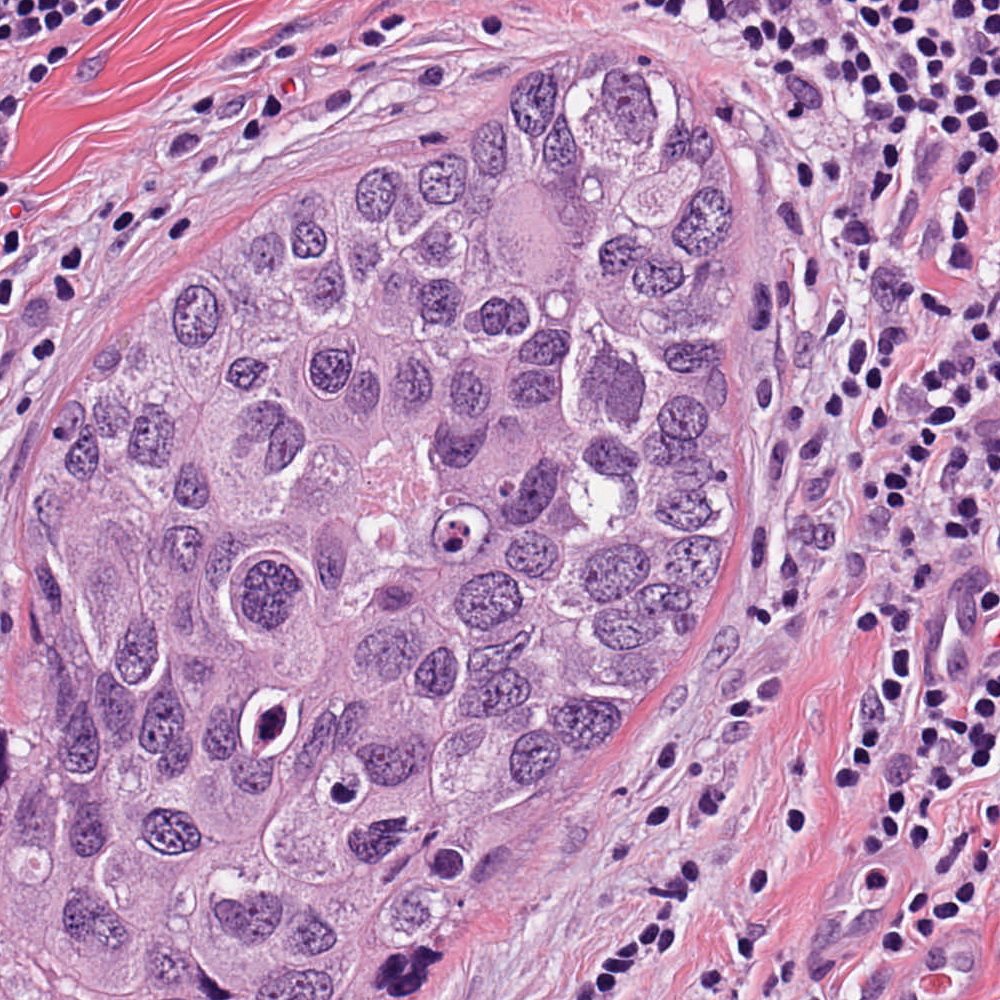

Test Image(Binary Mask):16


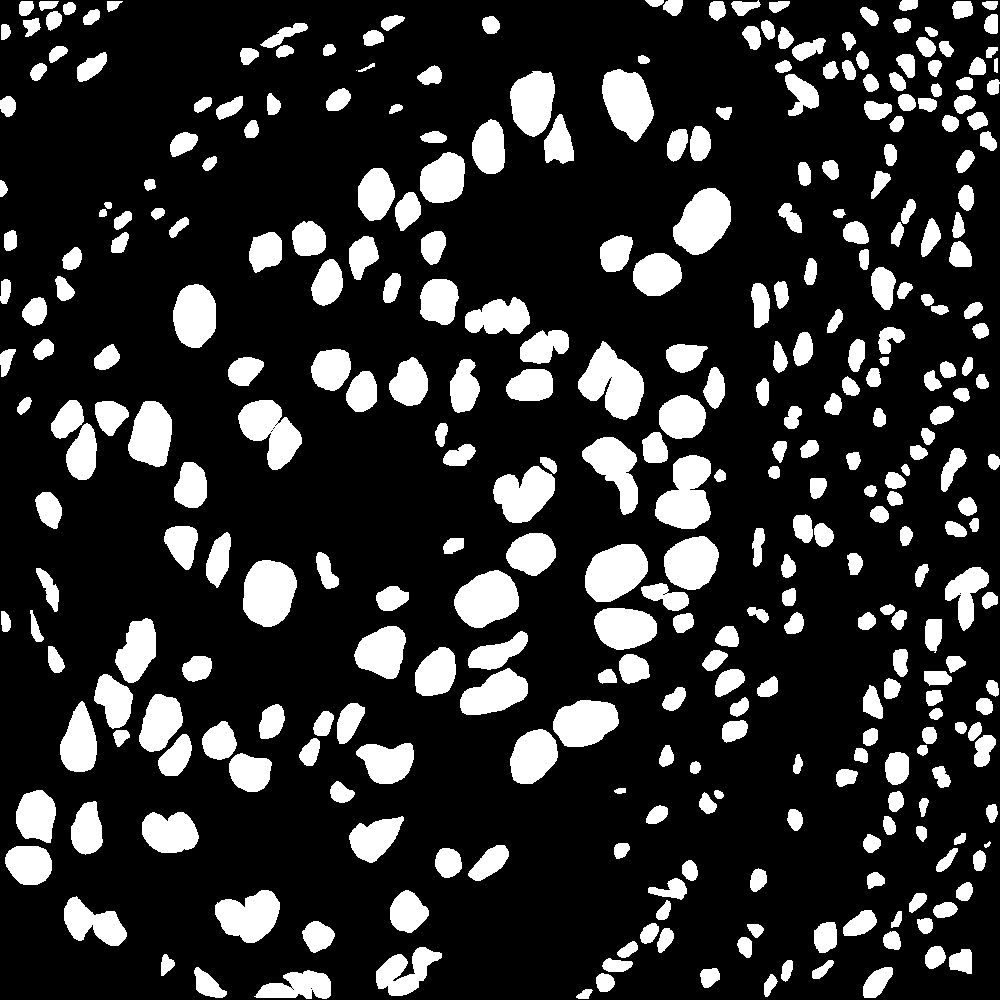

Test Image(Color Mask):16


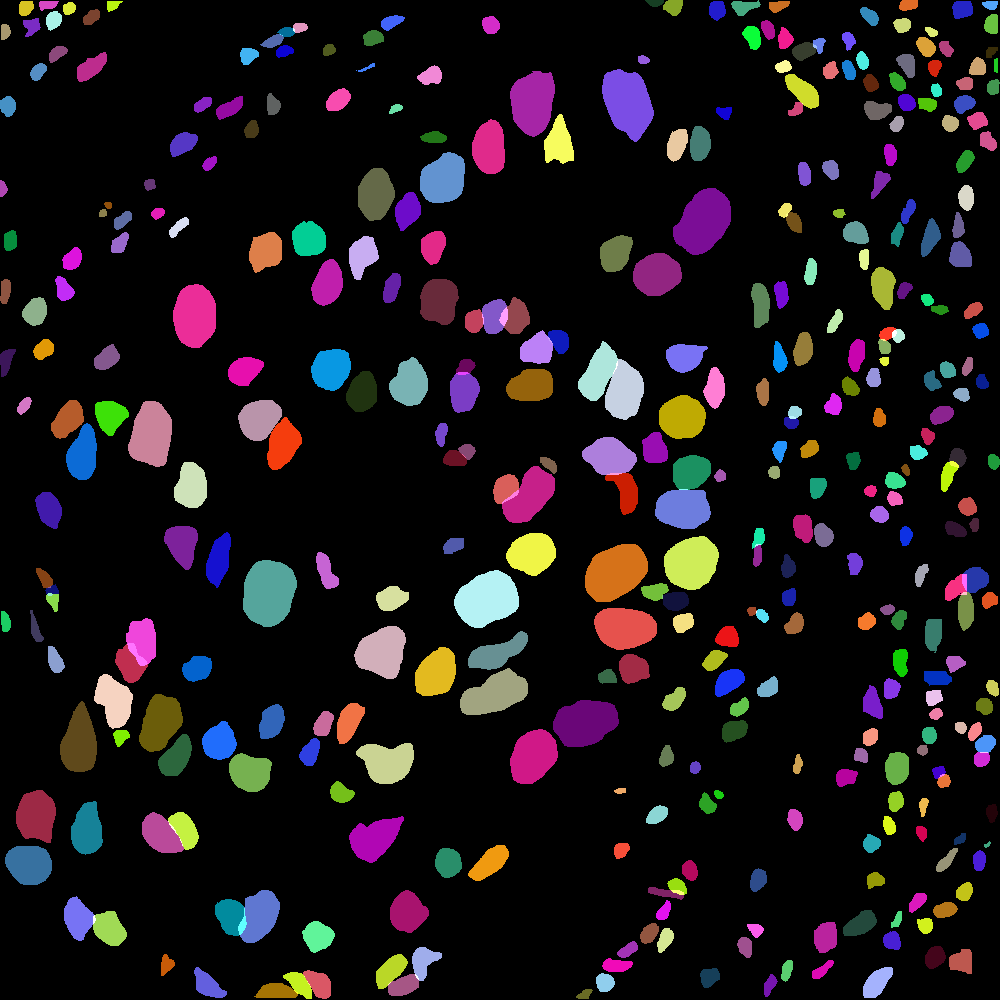

Train Image:20


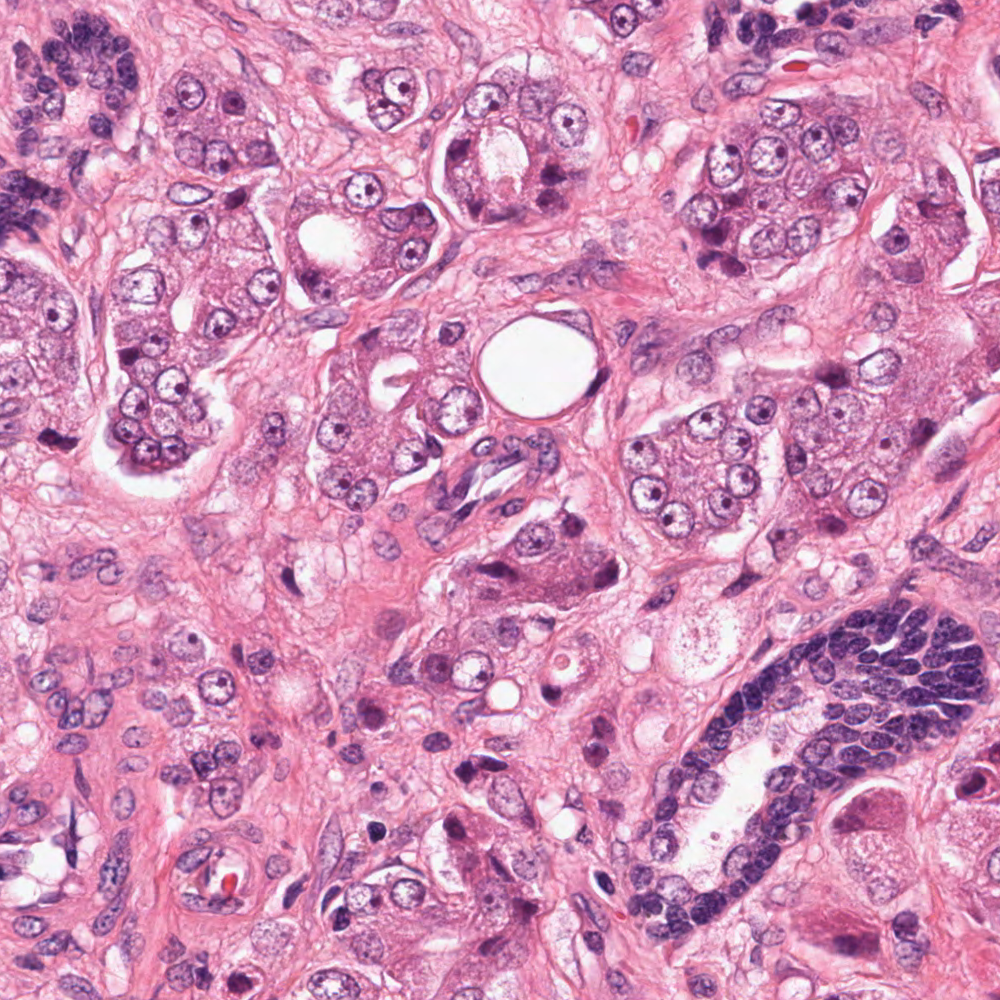

Test Image(Binary Mask):20


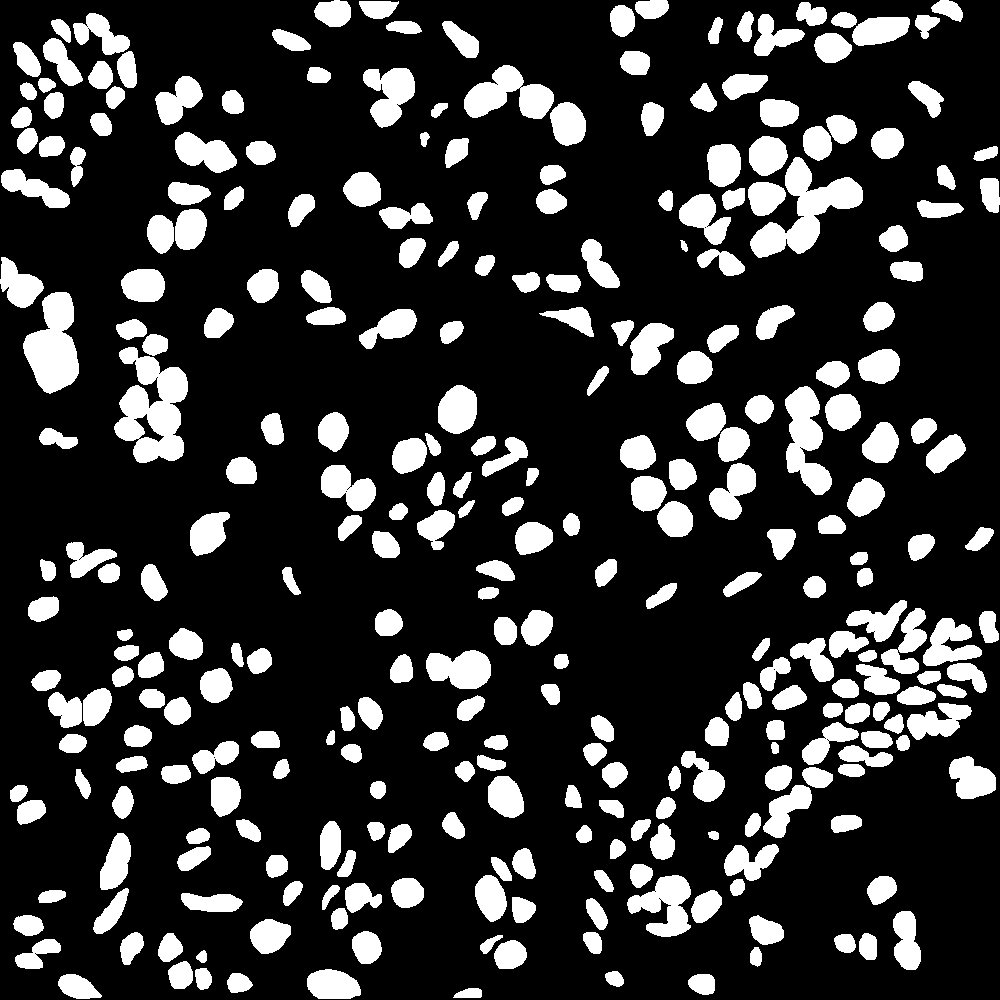

Test Image(Color Mask):20


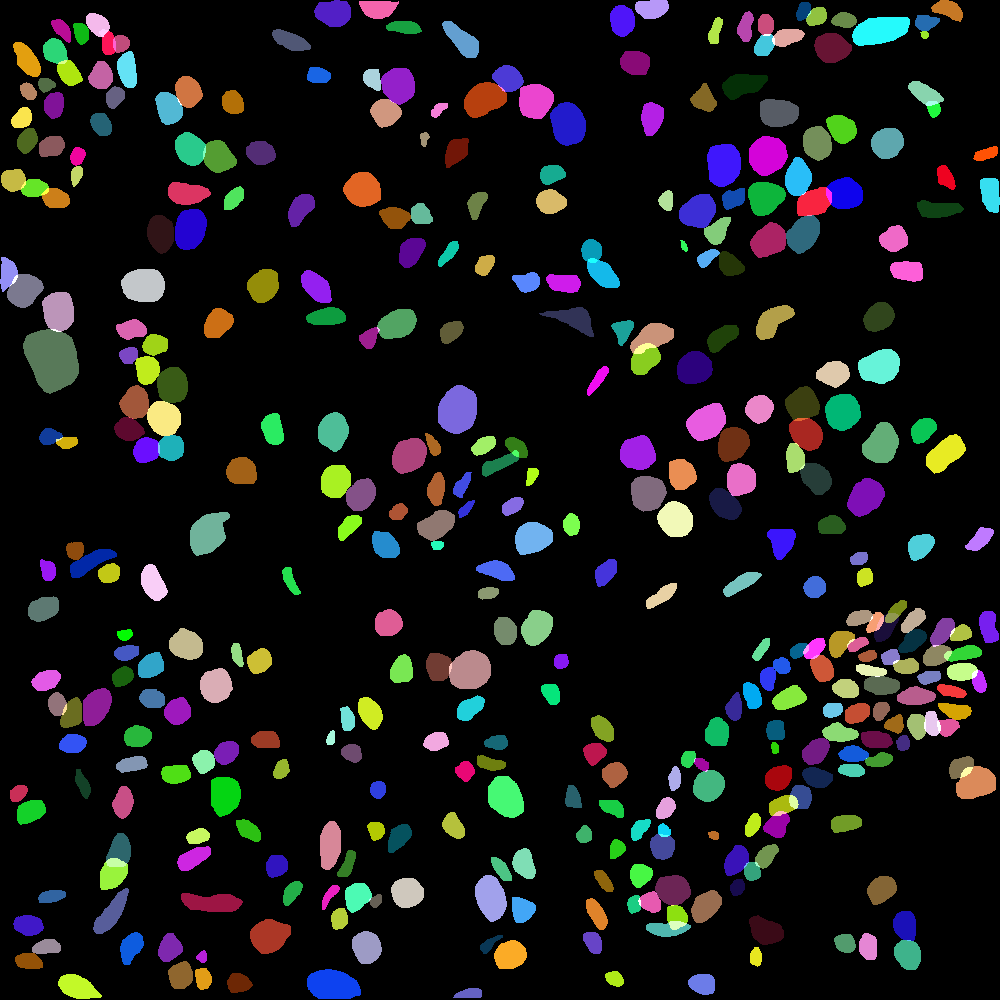

Train Image:21


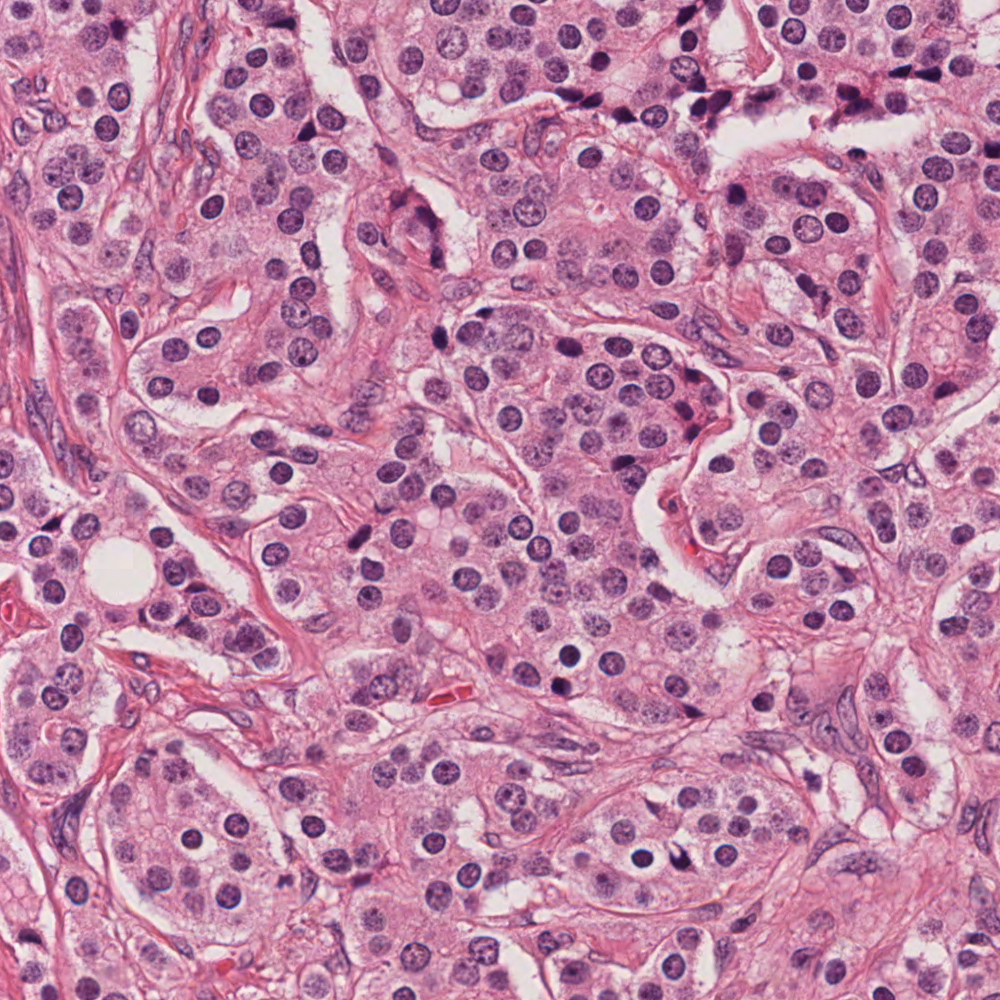

Test Image(Binary Mask):21


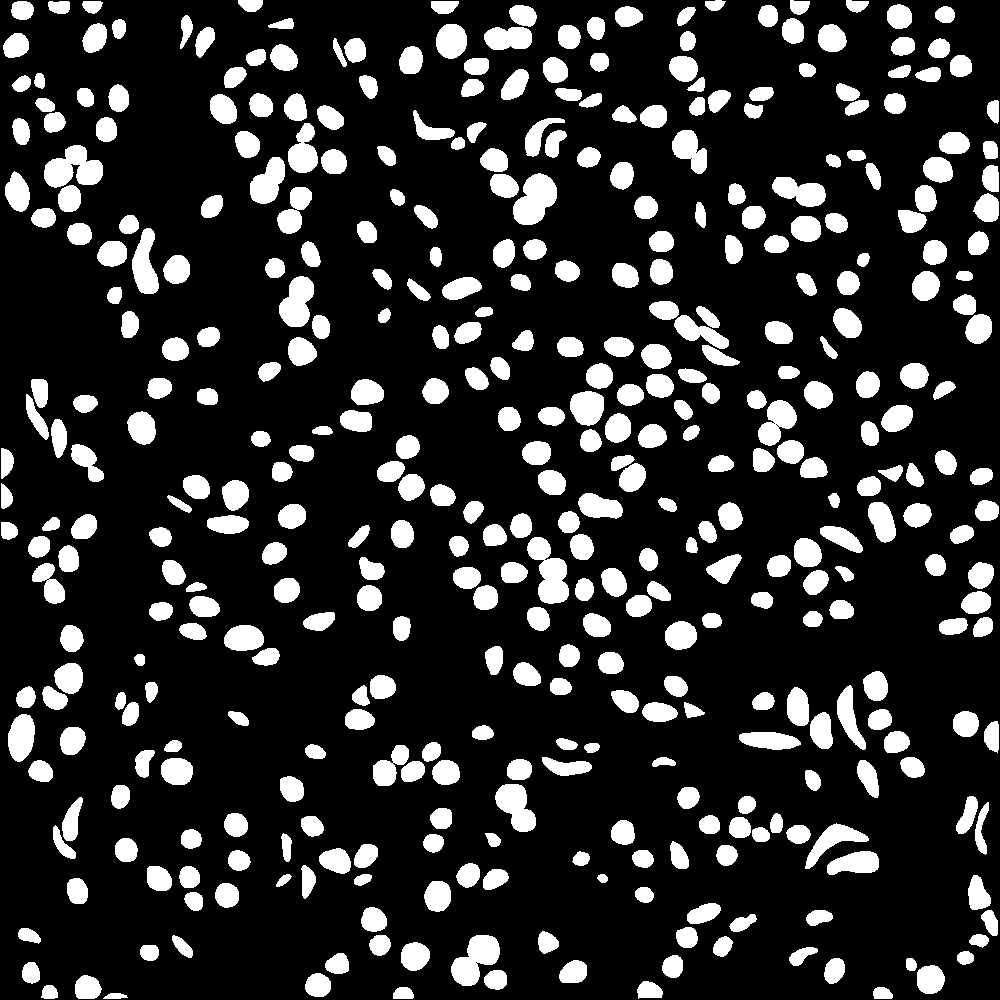

Test Image(Color Mask):21


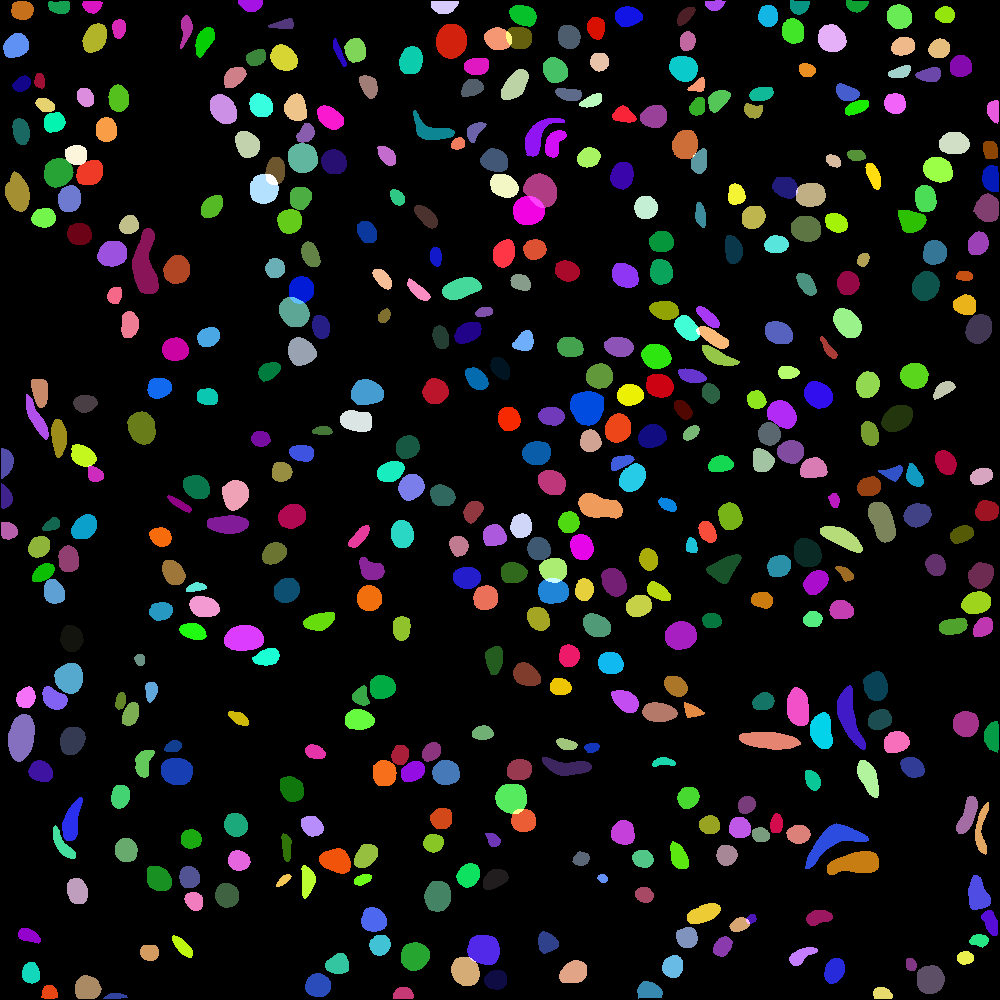

In [ ]:
#Display Train Data

#Disply random set of Tissue image and Masks(B&W and Color)
index=np.arange(0,len(xtrain_plist)) #Genertae the index for input image paths
rand.shuffle(index) #Randomize the index
index=index[0:3] #Select only the first 3 elements of randomised index

#Print the images and respective masks for the selete index
#Ierate over the index and display Imges & respective masks
for i in index:
    print("Train Image:"+str(i))
    img = cv2.imread(xtrain_plist[i],cv2.IMREAD_COLOR) #Print Tissue image
    cv2_imshow(img)
    print("Test Image(Binary Mask):"+str(i))
    img = cv2.imread(ybtrain_plist[i],cv2.IMREAD_GRAYSCALE) #Print Binary(B&W) Mask image
    cv2_imshow(img)
    print("Test Image(Color Mask):"+str(i))
    img = cv2.imread(yctrain_plist[i],cv2.IMREAD_COLOR) #Print Color Mask image
    cv2_imshow(img)


Test Image:13


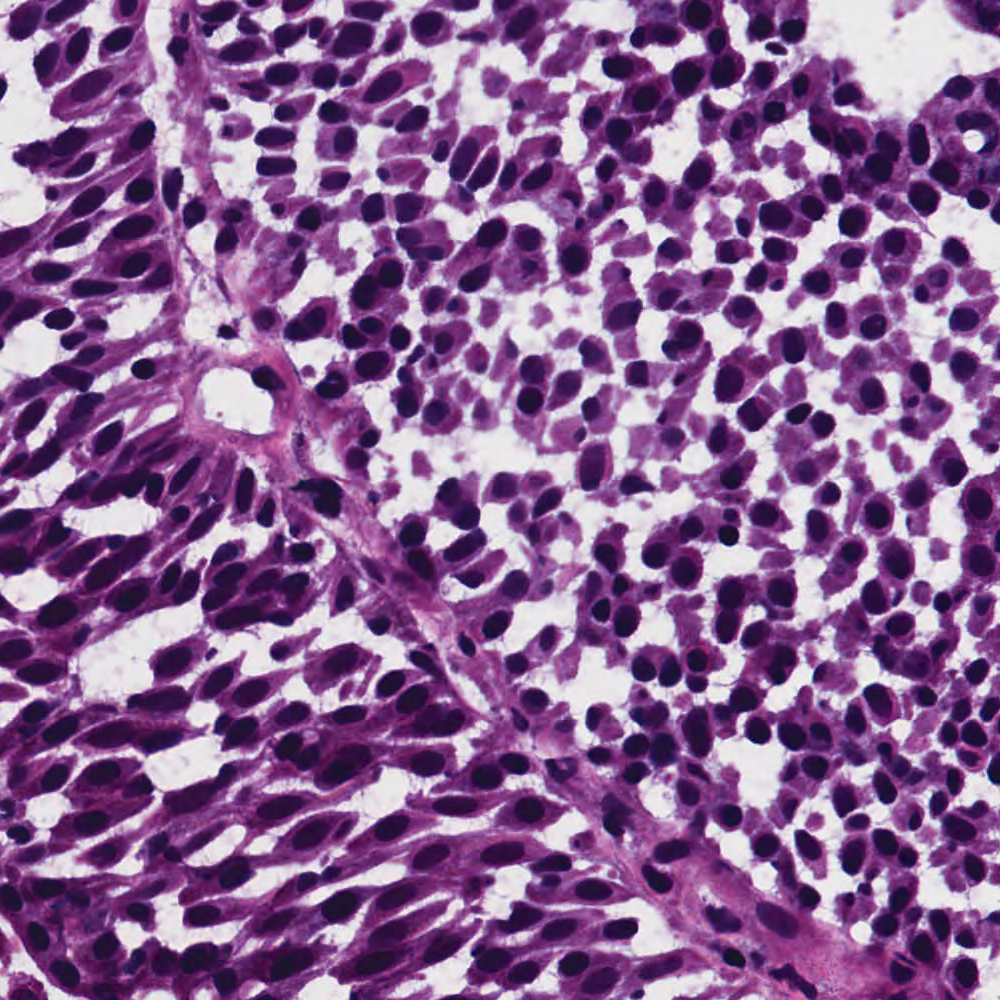

Test Image(Binary Mask):13


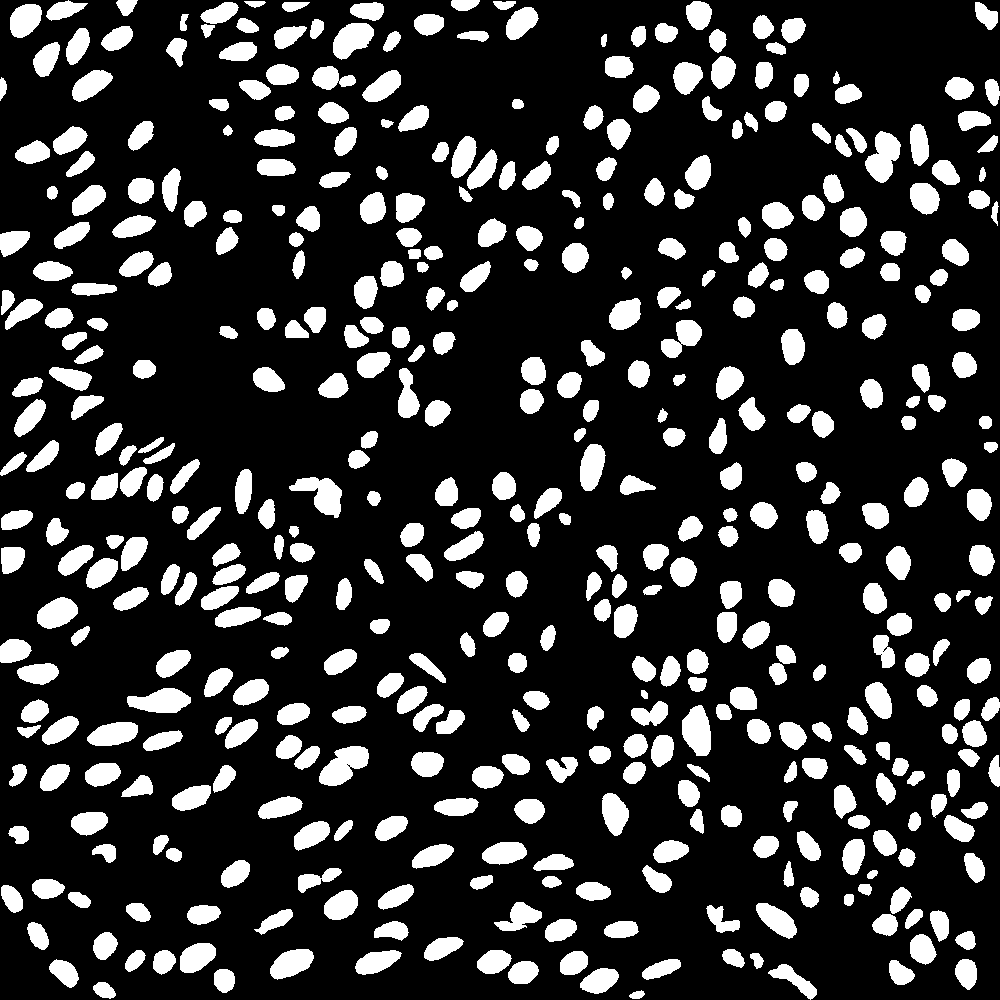

Test Image(Color Mask):13


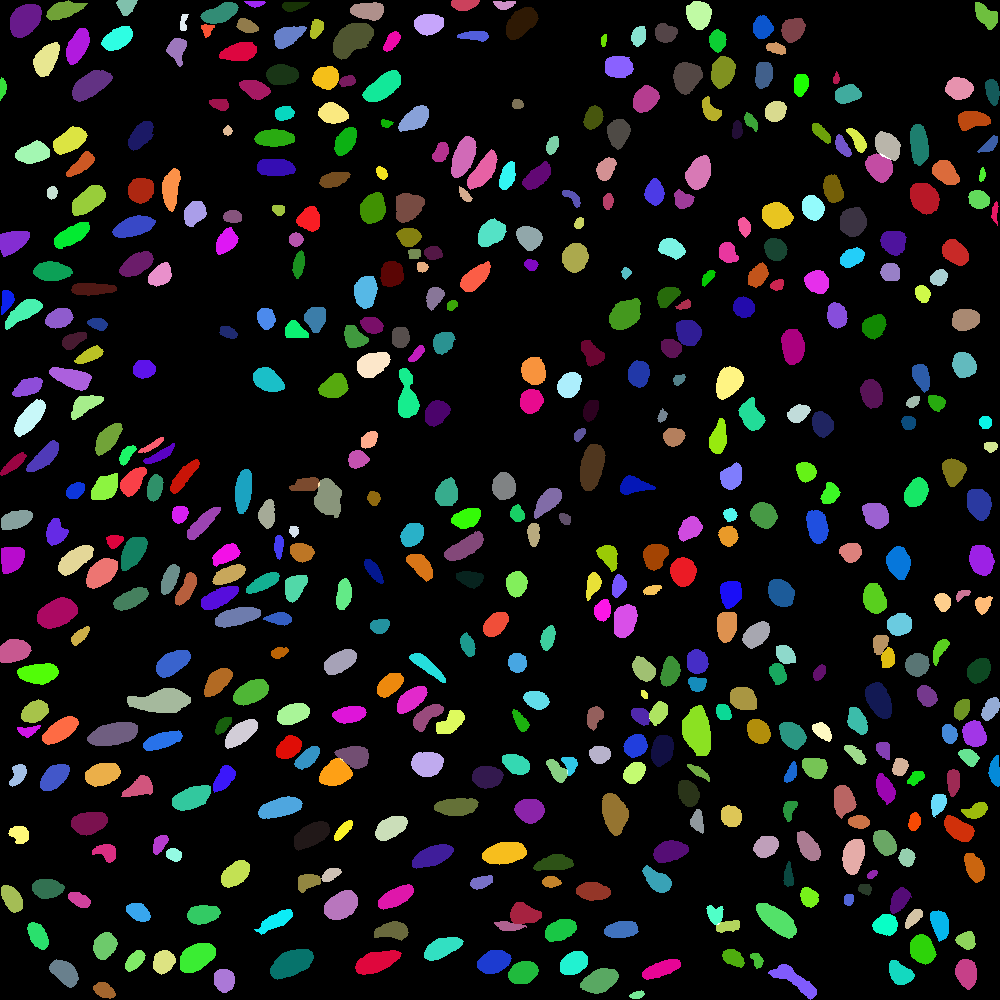

Test Image:4


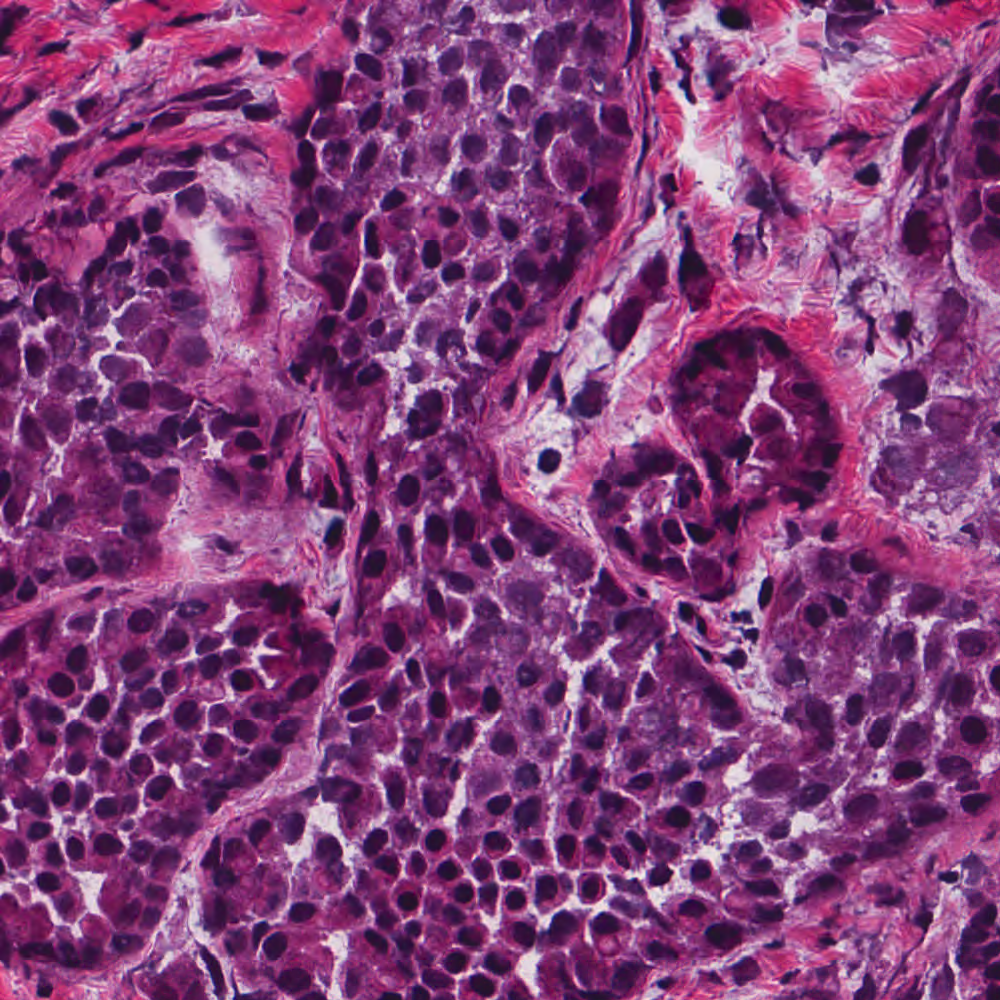

Test Image(Binary Mask):4


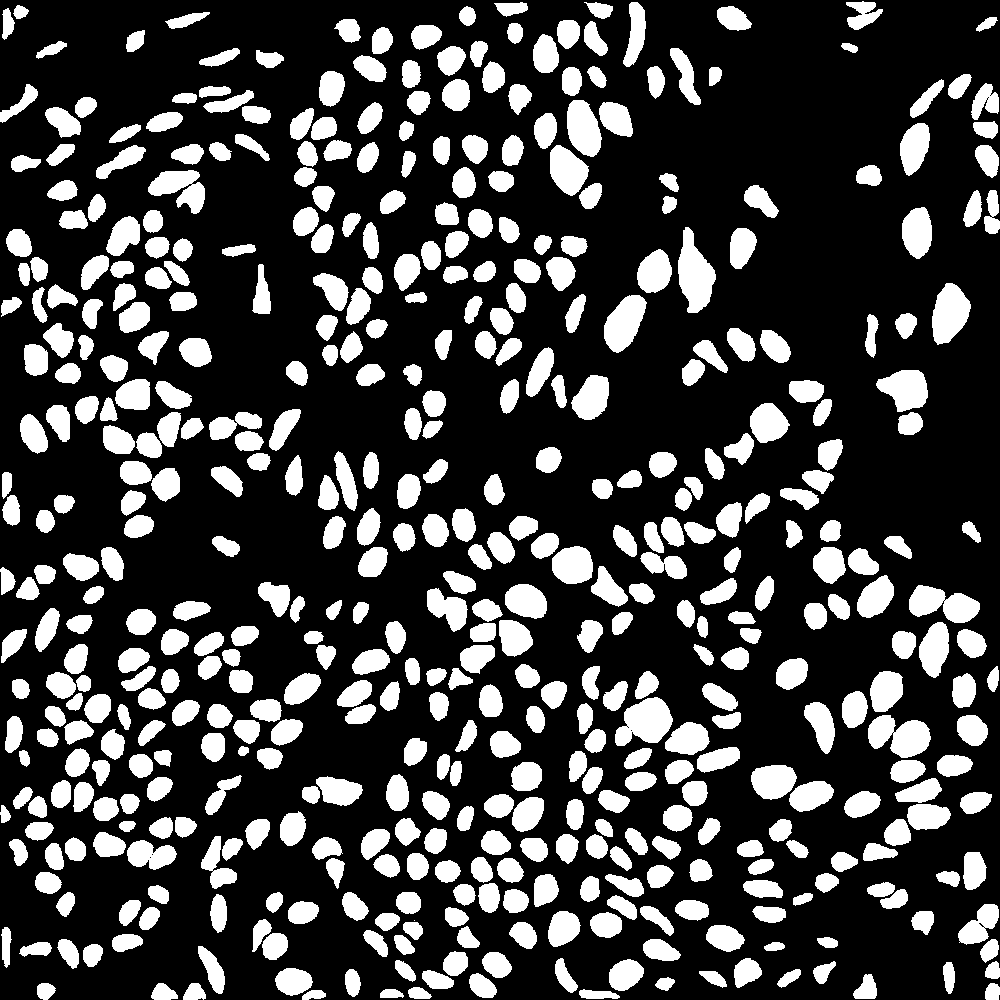

Test Image(Color Mask):4


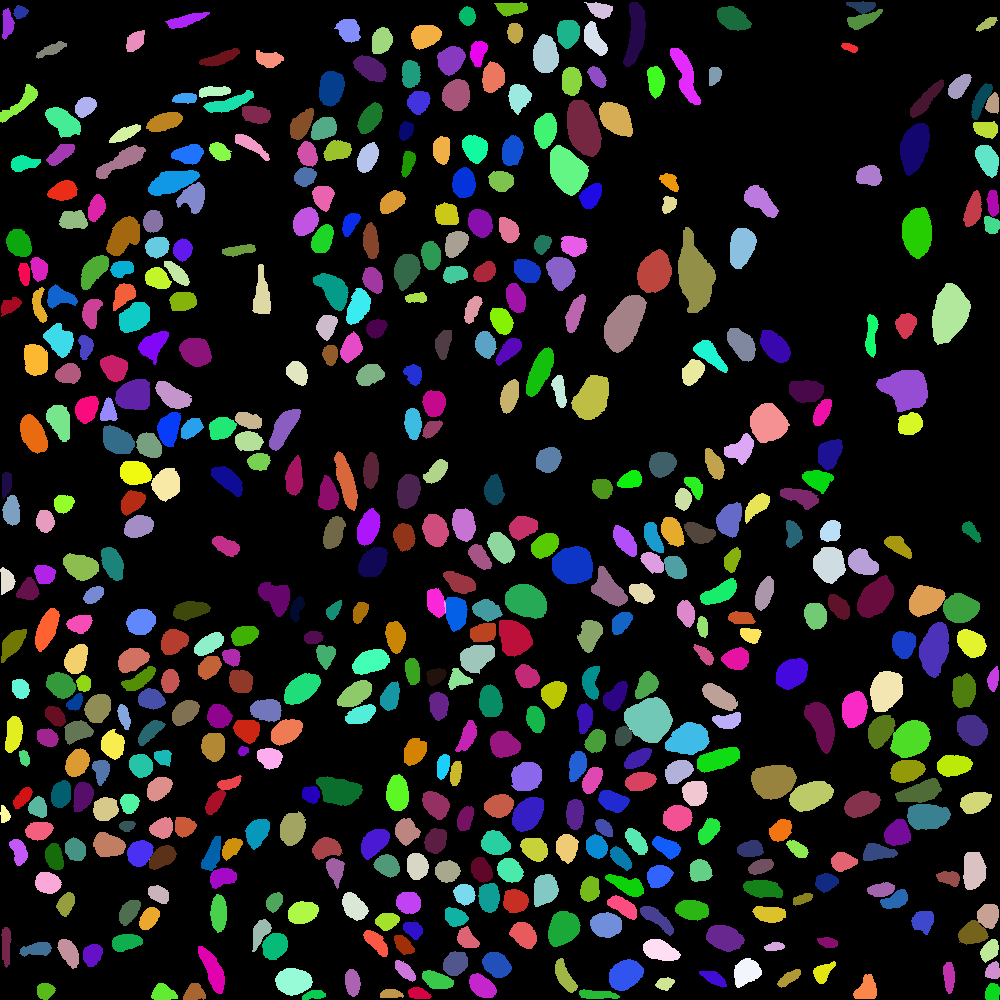

Test Image:6


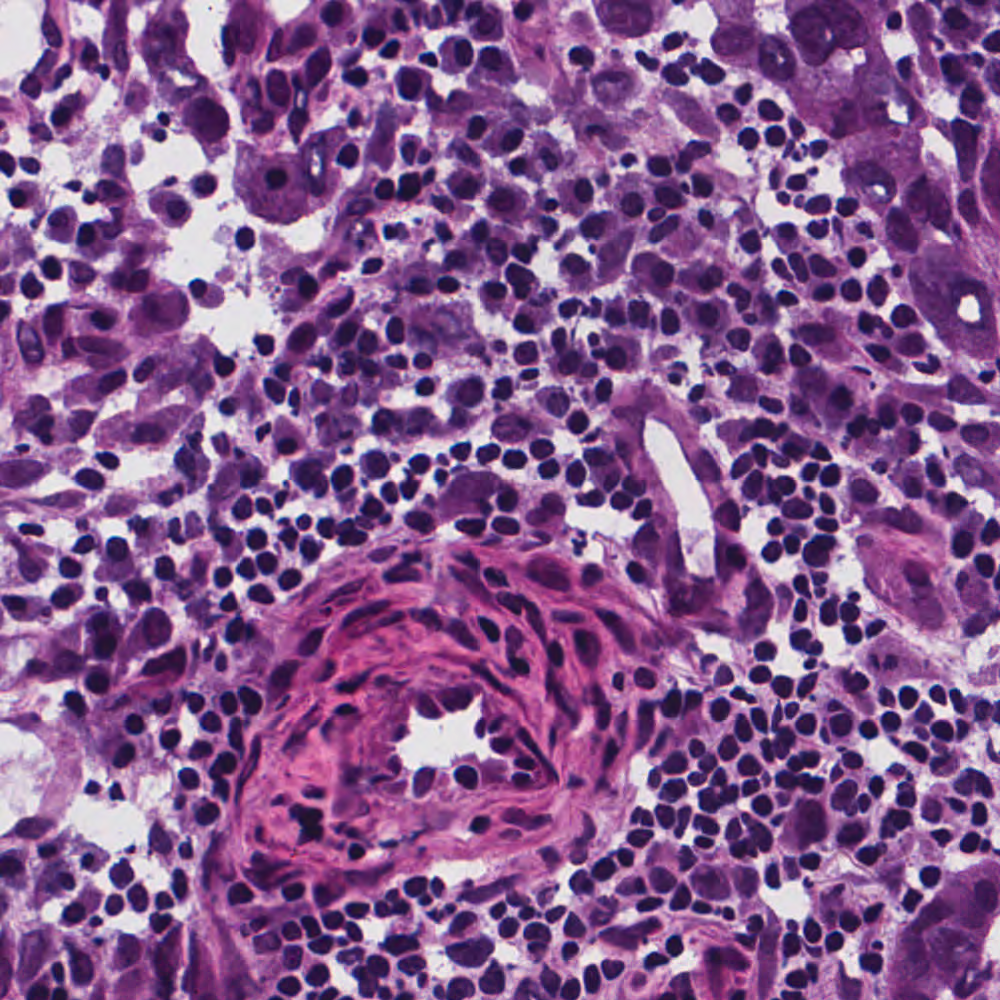

Test Image(Binary Mask):6


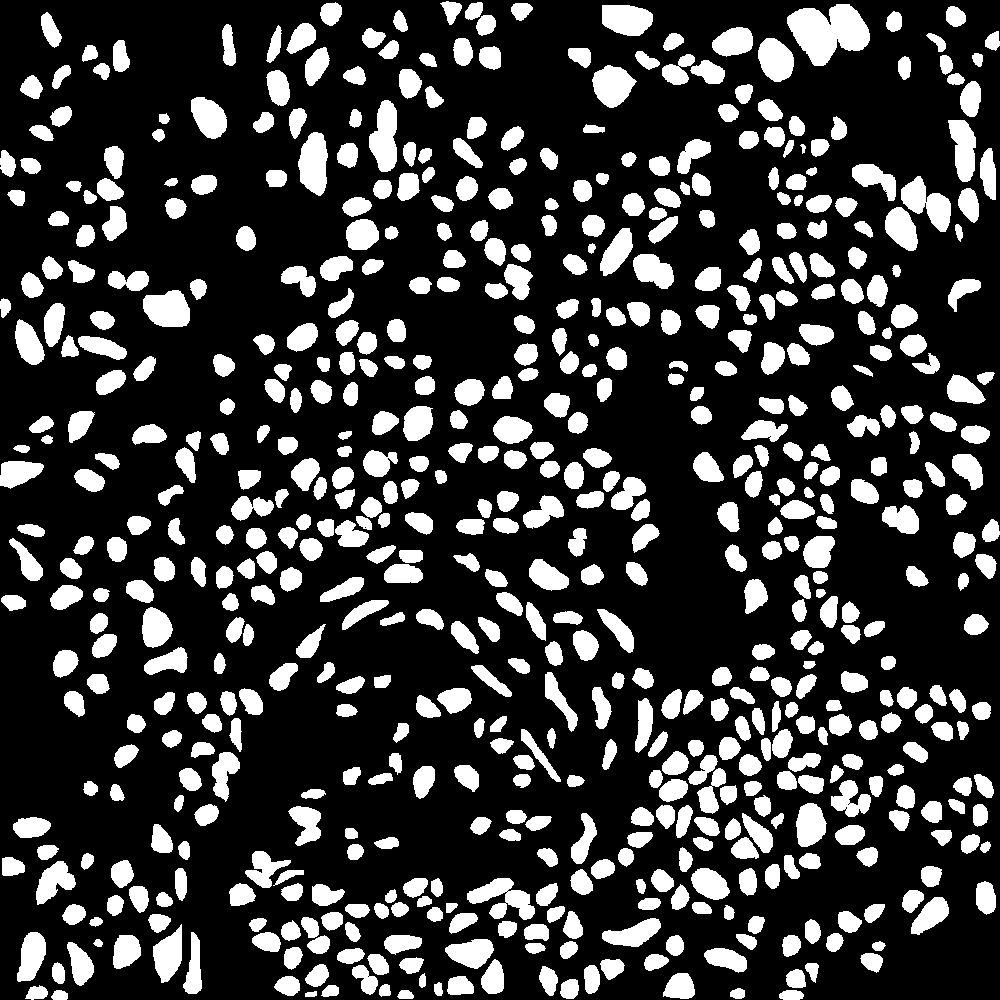

Test Image(Color Mask):6


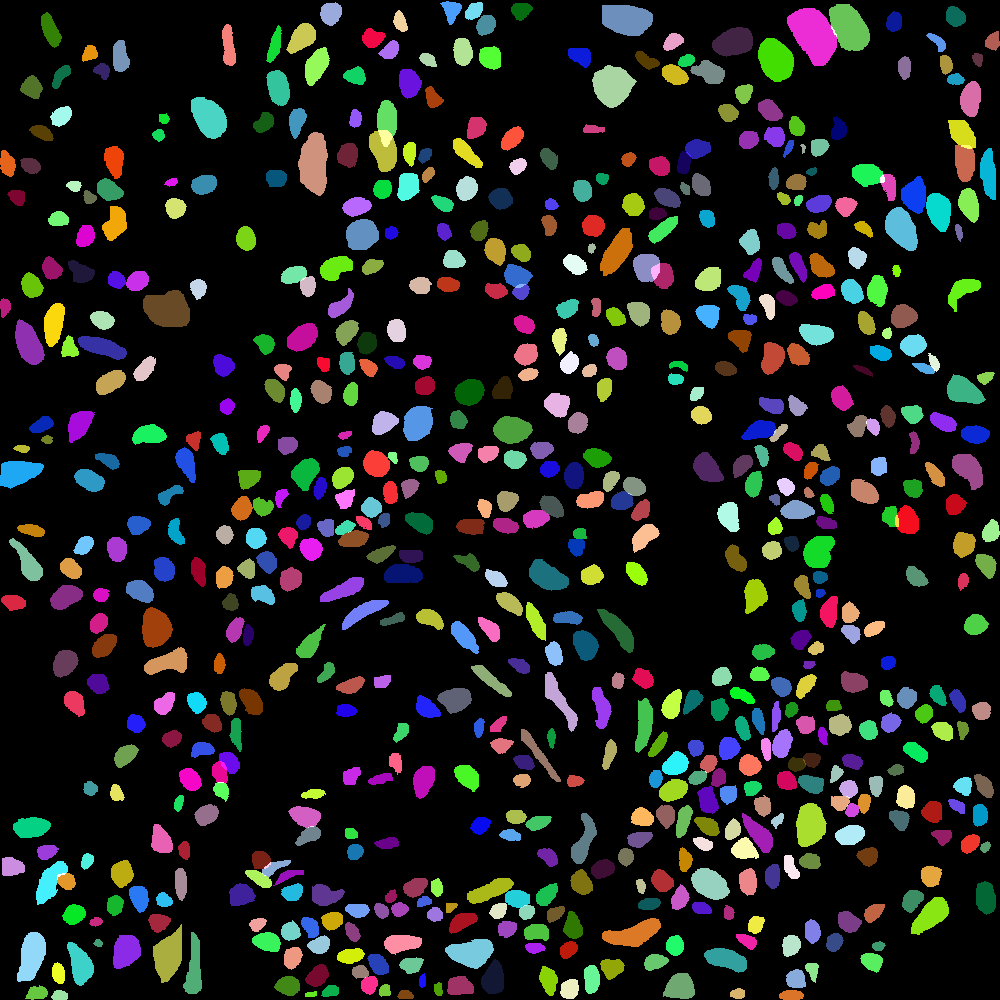

In [ ]:
#Display Test Data

#Disply random set of Tissue image and Masks(B&W and Color)
index=np.arange(0,len(xtest_plist)) #Gneertae the index for the input image path
rand.shuffle(index) #Randomize the index
index=index[0:3] #Select only the first 3 elements of randomised index

#Print the images and respective masks for the selete index
#Ierate over the index and display Imges & respective masks
for i in index:
    print("Test Image:"+str(i))
    img = cv2.imread(xtest_plist[i],cv2.IMREAD_COLOR) #Print Tissue image
    cv2_imshow(img)
    print("Test Image(Binary Mask):"+str(i))
    img = cv2.imread(ybtest_plist[i],cv2.IMREAD_GRAYSCALE) #Print Binary(B&W) Mask image
    cv2_imshow(img)
    print("Test Image(Color Mask):"+str(i))
    img = cv2.imread(yctest_plist[i],cv2.IMREAD_COLOR) #Print Color Mask image
    cv2_imshow(img)

**2&3) UNet Implementation for Semantic Segmentation**

In [ ]:
#PGenerate train and test image data set

def proImgData(pathlist,isColor,padwidth=4):
    #Function to process to pad the image to match imput size of neural net
    list_len=len(pathlist) #
    if isColor:
        #For color image stacking generate an empty 3D array
        img_stack=np.empty([list_len,1000+2*padwidth,1000+2*padwidth,3])
    else:
        #For greyscale image stacking generate an empty 3D array
        img_stack=np.empty([list_len,1000+2*padwidth,1000+2*padwidth])
    
    #Iterate over the list of paths
    for idx,path in enumerate(pathlist):
        if isColor:
            #For color image....
            img = cv2.imread(path,cv2.IMREAD_COLOR) #Read image
            img = imPad(img,padwidth) #Pas image with refleced boundaries
            img_stack[idx,:,:,:]=img #Stack the image to the image stack
        else:
            #For color image....
            img = cv2.imread(path,cv2.IMREAD_GRAYSCALE) #Read image
            img = imPad(img,padwidth) #Pas image with refleced boundaries
            img_stack[idx,:,:]=img #Stack the image to the image stack

    img_stack = tf.cast(img_stack, tf.float32)/255.0 #Scale and type cast to float32
    return(img_stack)


xtrain=proImgData(xtrain_plist,isColor=True)
ybtrain=proImgData(ybtrain_plist,isColor=False)
xtest=proImgData(xtest_plist,isColor=True)
ybtest=proImgData(ybtest_plist,isColor=False)

Unet Implementation with Dice Loss

In [ ]:
M=1008 #Pixel size of image
F=40 #Channels in the first layer. Channels doubles every layer
initializer='he_normal' #Default kernal initialisation algorithm
#--------------------------------------------------------------------------------------------------------------------
x_input = tf.keras.layers.Input(shape =(M,M, 3)) #Input layer defined with size of image
#------------------------------Downstream Path-1----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(x_input)
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_1)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1) #Batch Normalisation layer
pool_1 = tf.keras.layers.MaxPooling2D((2, 2))(conv_1) #Maxpool layer reduces feature set by 4
#------------------------------Downstream Path-2----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_1)
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_2)
#conv_2 = tf.keras.layers.BatchNormalization()(conv_2) #Batch Normalisation layer
pool_2 = tf.keras.layers.MaxPooling2D((2, 2))(conv_2) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-3---------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_2)
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_3)
conv_3 = tf.keras.layers.BatchNormalization()(conv_3) #Batch Normalisation layer
pool_3 = tf.keras.layers.MaxPooling2D((2, 2))(conv_3) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-4----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_3)
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_4)
#conv_4 = tf.keras.layers.BatchNormalization()(conv_4) #Batch Normalisation layer
pool_4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_4) #Maxpool layer reduces feature set by 4
 #------------------------------Bottleneck-----------------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_4)
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_5)
conv_5 = tf.keras.layers.BatchNormalization()(conv_5) #Batch Normalisation layer
#------------------------------Upstream Path-1------------------------------------------------------------------------
#Upsampling image
uconv_6 = tf.keras.layers.Conv2DTranspose(32*F, (2, 2), strides=(2, 2), padding='same')(conv_5)
uconv_6 = tf.keras.layers.concatenate([uconv_6, conv_4]) #Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_6)
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_6)
#conv_6 = tf.keras.layers.BatchNormalization()(conv_6) #Batch Normalisation layer
 #------------------------------Upstream Path-2------------------------------------------------------------------------
#Upsampling image
uconv_7 = tf.keras.layers.Conv2DTranspose(4*F, (2, 2), strides=(2, 2), padding='same')(conv_6)
uconv_7 = tf.keras.layers.concatenate([uconv_7, conv_3])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_7)
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_7)
conv_7 = tf.keras.layers.BatchNormalization()(conv_7) #Batch Normalisation layer
#------------------------------Upstream Path-3------------------------------------------------------------------------
#Upsampling image
uconv_8 = tf.keras.layers.Conv2DTranspose(2*F, (2, 2), strides=(2, 2), padding='same')(conv_7)
uconv_8 = tf.keras.layers.concatenate([uconv_8, conv_2])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_8)
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_8)
#conv_8 = tf.keras.layers.BatchNormalization()(conv_8) #Batch Normalisation layer
#------------------------------Upstream Path-4------------------------------------------------------------------------
#Upsampling image
uconv_9 = tf.keras.layers.Conv2DTranspose(F, (2, 2), strides=(2, 2), padding='same')(conv_8)
uconv_9 = tf.keras.layers.concatenate([uconv_9, conv_1], axis=3)#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_9)
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_9)
conv_9 = tf.keras.layers.BatchNormalization()(conv_9) #Batch Normalisation layer
 #------------------------------Output------------------------------------------------------------------------------
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(conv_9)
 
modelA = tf.keras.Model(inputs=[x_input], outputs=[outputs]) #generating model from layer
print(modelA.summary()) #Print model summary
modelA.compile(optimizer='adam', loss=DiceLoss,metrics=[diceScore]) #Compiling model(Set optimiser, Loss function, Performance Matrix)
history=modelA.fit(xtrain, ybtrain, batch_size=4, epochs=20, verbose=1, shuffle=True,validation_split=0.2) #Train model

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 1008, 1008,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_19 (Conv2D)             (None, 1008, 1008,   1120        ['input_2[0][0]']                
                                40)                                                               
                                                                                                  
 conv2d_20 (Conv2D)             (None, 1008, 1008,   14440       ['conv2d_19[0][0]']              
                                40)                                                         

Plotting Unet results with diceLoss

In [ ]:
iter=2
padwidth=8
crop_length=2*padwidth
img_pred=np.empty((iter,M-crop_length,M-crop_length)).astype(int)
img_act=np.empty((iter,M-crop_length,M-crop_length)).astype(int)
y_pred=modelA.predict(xtest[0:iter,:,:,:])
for i in range(iter):
  tmp_img=y_pred[i,:,:,0]
  #tmp_img=1-tmp_img
  tmp_img[tmp_img>0.6]=255
  tmp_img[tmp_img<=0.6]=0
  tmp_img=tmp_img.astype(int)[padwidth:-padwidth,padwidth:-padwidth]
  img_pred[i,:,:]=tmp_img

  img_act[i,:,:]=(np.array(ybtest[i,:,:])*255).astype(int)[padwidth:-padwidth,padwidth:-padwidth]


1/1 [==============================] - 0s 277ms/step


4) Plotting Sample Images with UNet model trained for DiceLoss

Image 1(Prediction)


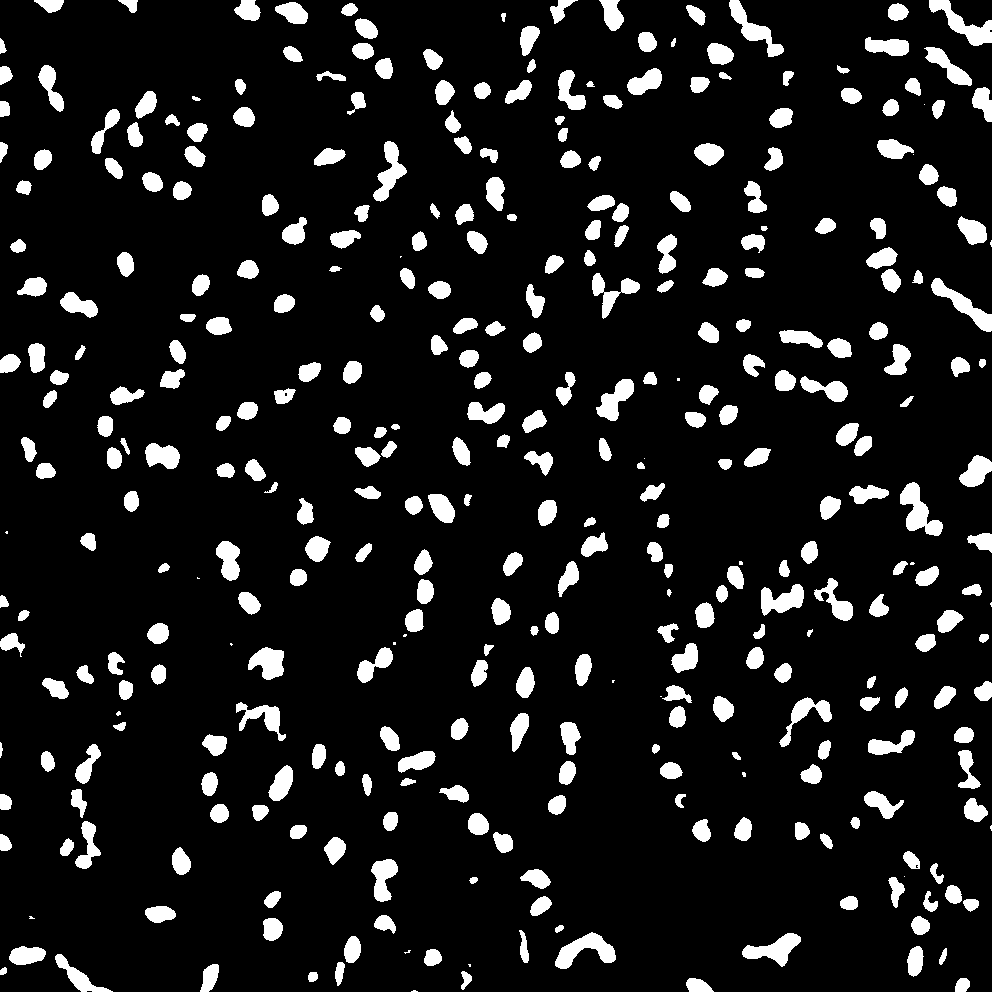

Image 1(Actual)


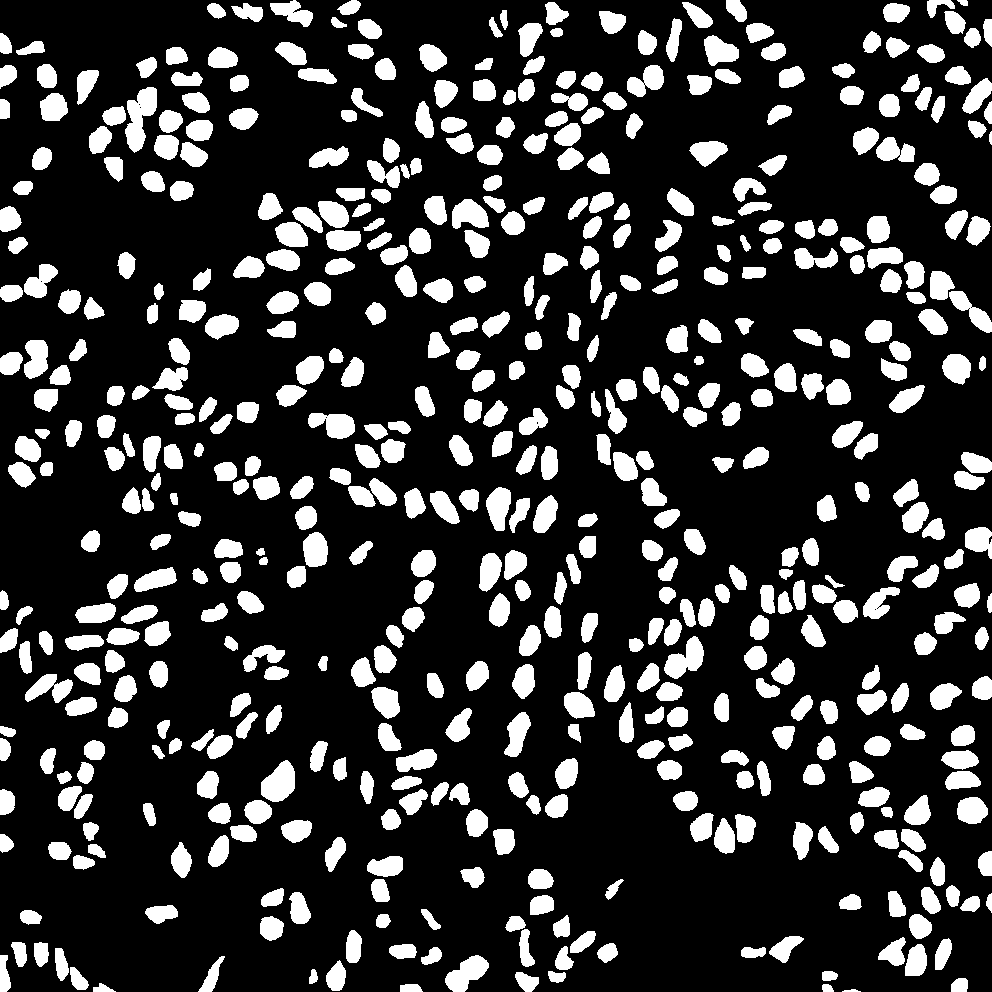

In [ ]:
print("Image 1(Prediction)")
cv2_imshow(img_pred[0,:,:])
print("Image 1(Actual)")
cv2_imshow(img_act[0,:,:])

Image 1(Prediction)


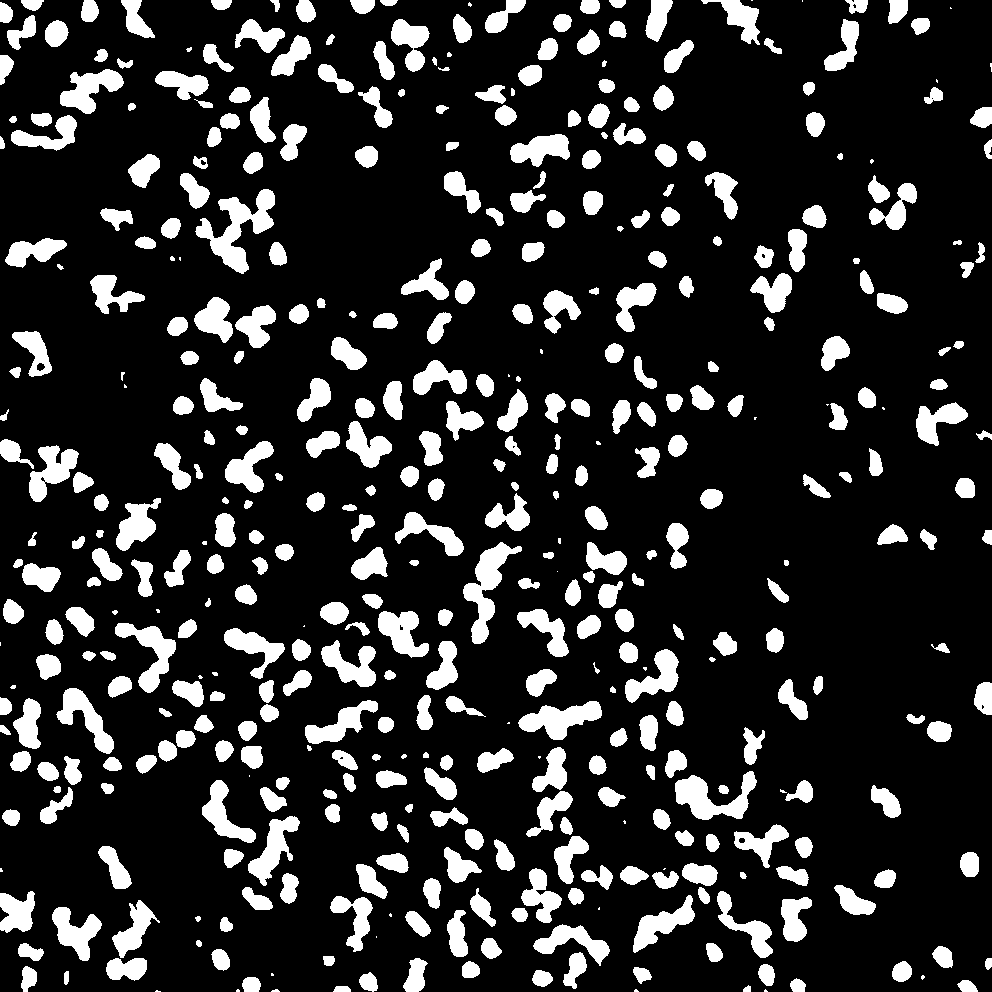

Image 1(Actual)


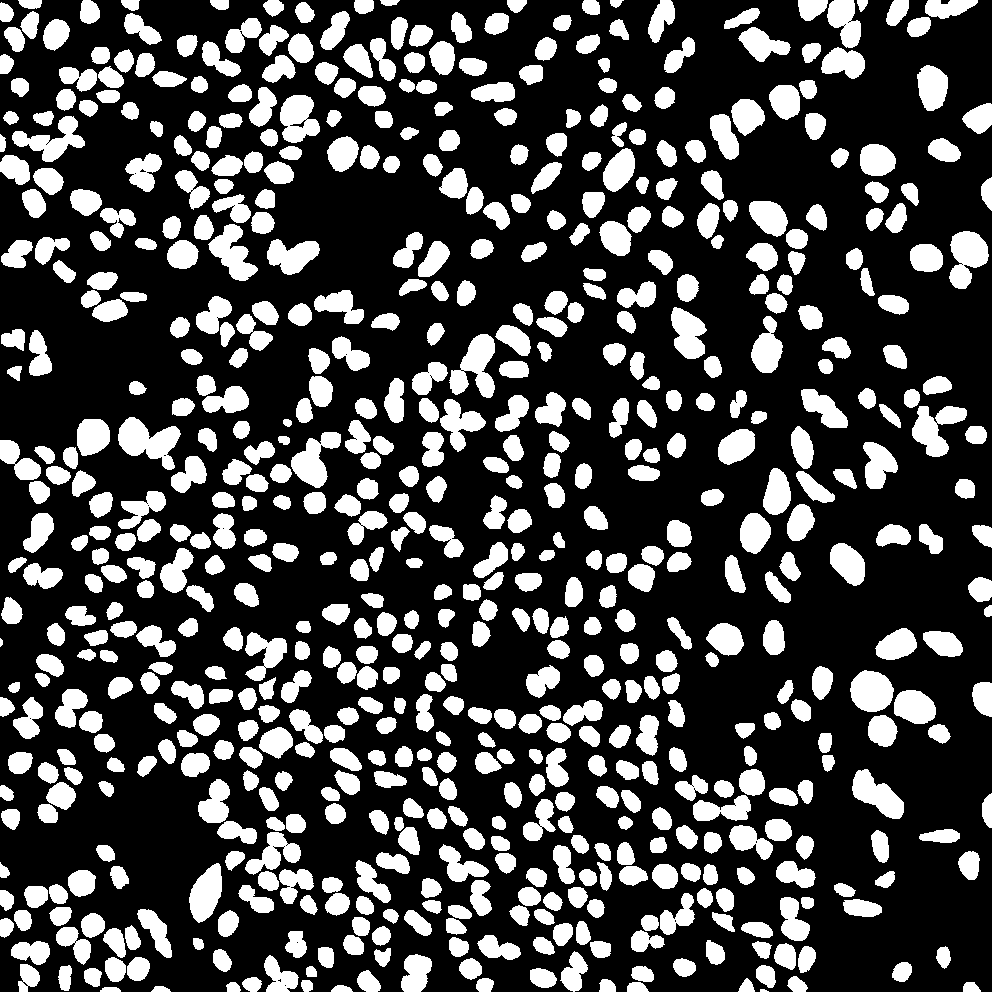

In [ ]:
print("Image 1(Prediction)")
cv2_imshow(img_pred[1,:,:])
print("Image 1(Actual)")
cv2_imshow(img_act[1,:,:])

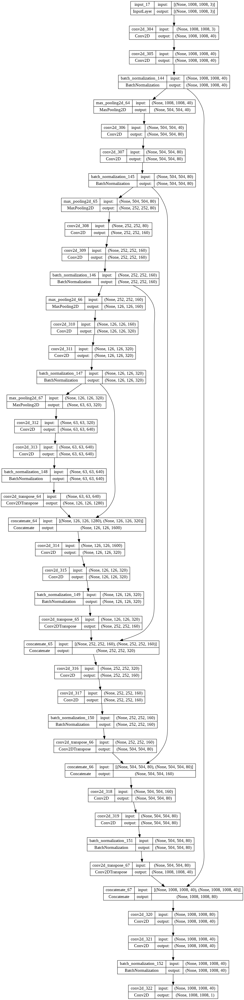

In [ ]:
plot_model(modelA, to_file = "./Model.png", show_shapes=True) #Save model in graph

 5) Modification of the baseline architecture

5.a)  Number of blocks in the UNet architecture 

(i) Extra convolution layer in upstream and downstream
Due to memory limitations, the the channels in each layers were halfed and an extra convolution layer was added on each upstream and downstram layers. The validation score was lesser that the original layer with double the channels and one less convolution layer and the cells detected are much less

In [ ]:
M=1008 #Pixel size of image
F=20 #Channels in the first layer. Channels doubles every layer
initializer='he_normal' #Default kernal initialisation algorithm
#--------------------------------------------------------------------------------------------------------------------
x_input = tf.keras.layers.Input(shape =(M,M, 3)) #Input layer defined with size of image
#------------------------------Downstream Path-1----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(x_input)
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_1)
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_1)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1) #Batch Normalisation layer
pool_1 = tf.keras.layers.MaxPooling2D((2, 2))(conv_1) #Maxpool layer reduces feature set by 4
#------------------------------Downstream Path-2----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_1)
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_2)
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_2)
#conv_2 = tf.keras.layers.BatchNormalization()(conv_2) #Batch Normalisation layer
pool_2 = tf.keras.layers.MaxPooling2D((2, 2))(conv_2) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-3---------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_2)
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_3)
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_3)
conv_3 = tf.keras.layers.BatchNormalization()(conv_3) #Batch Normalisation layer
pool_3 = tf.keras.layers.MaxPooling2D((2, 2))(conv_3) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-4----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_3)
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_4)
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_4)
#conv_4 = tf.keras.layers.BatchNormalization()(conv_4) #Batch Normalisation layer
pool_4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_4) #Maxpool layer reduces feature set by 4
 #------------------------------Bottleneck-----------------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_4)
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_5)
conv_5 = tf.keras.layers.BatchNormalization()(conv_5) #Batch Normalisation layer
#------------------------------Upstream Path-1------------------------------------------------------------------------
#Upsampling image
uconv_6 = tf.keras.layers.Conv2DTranspose(32*F, (2, 2), strides=(2, 2), padding='same')(conv_5)
uconv_6 = tf.keras.layers.concatenate([uconv_6, conv_4]) #Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_6)
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_6)
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_6)
#conv_6 = tf.keras.layers.BatchNormalization()(conv_6) #Batch Normalisation layer
 #------------------------------Upstream Path-2------------------------------------------------------------------------
#Upsampling image
uconv_7 = tf.keras.layers.Conv2DTranspose(4*F, (2, 2), strides=(2, 2), padding='same')(conv_6)
uconv_7 = tf.keras.layers.concatenate([uconv_7, conv_3])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_7)
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_7)
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_7)
conv_7 = tf.keras.layers.BatchNormalization()(conv_7) #Batch Normalisation layer
#------------------------------Upstream Path-3------------------------------------------------------------------------
#Upsampling image
uconv_8 = tf.keras.layers.Conv2DTranspose(2*F, (2, 2), strides=(2, 2), padding='same')(conv_7)
uconv_8 = tf.keras.layers.concatenate([uconv_8, conv_2])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_8)
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_8)
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_8)
#conv_8 = tf.keras.layers.BatchNormalization()(conv_8) #Batch Normalisation layer
#------------------------------Upstream Path-4------------------------------------------------------------------------
#Upsampling image
uconv_9 = tf.keras.layers.Conv2DTranspose(F, (2, 2), strides=(2, 2), padding='same')(conv_8)
uconv_9 = tf.keras.layers.concatenate([uconv_9, conv_1], axis=3)#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_9)
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_9)
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_9)
conv_9 = tf.keras.layers.BatchNormalization()(conv_9) #Batch Normalisation layer
 #------------------------------Output------------------------------------------------------------------------------
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(conv_9)
 
model = tf.keras.Model(inputs=[x_input], outputs=[outputs]) #generating model from layer
print(model.summary()) #Print model summary
model.compile(optimizer='adam', loss=DiceLoss,metrics=[diceScore]) #Compiling model(Set optimiser, Loss function, Performance Matrix)
history=model.fit(xtrain, ybtrain, batch_size=4, epochs=20, verbose=1, shuffle=True,validation_split=0.2) #Train model

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 1008, 1008,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_38 (Conv2D)             (None, 1008, 1008,   560         ['input_3[0][0]']                
                                20)                                                               
                                                                                                  
 conv2d_39 (Conv2D)             (None, 1008, 1008,   3620        ['conv2d_38[0][0]']              
                                20)                                                         

1/1 [==============================] - 1s 843ms/step
Image 1(Prediction)


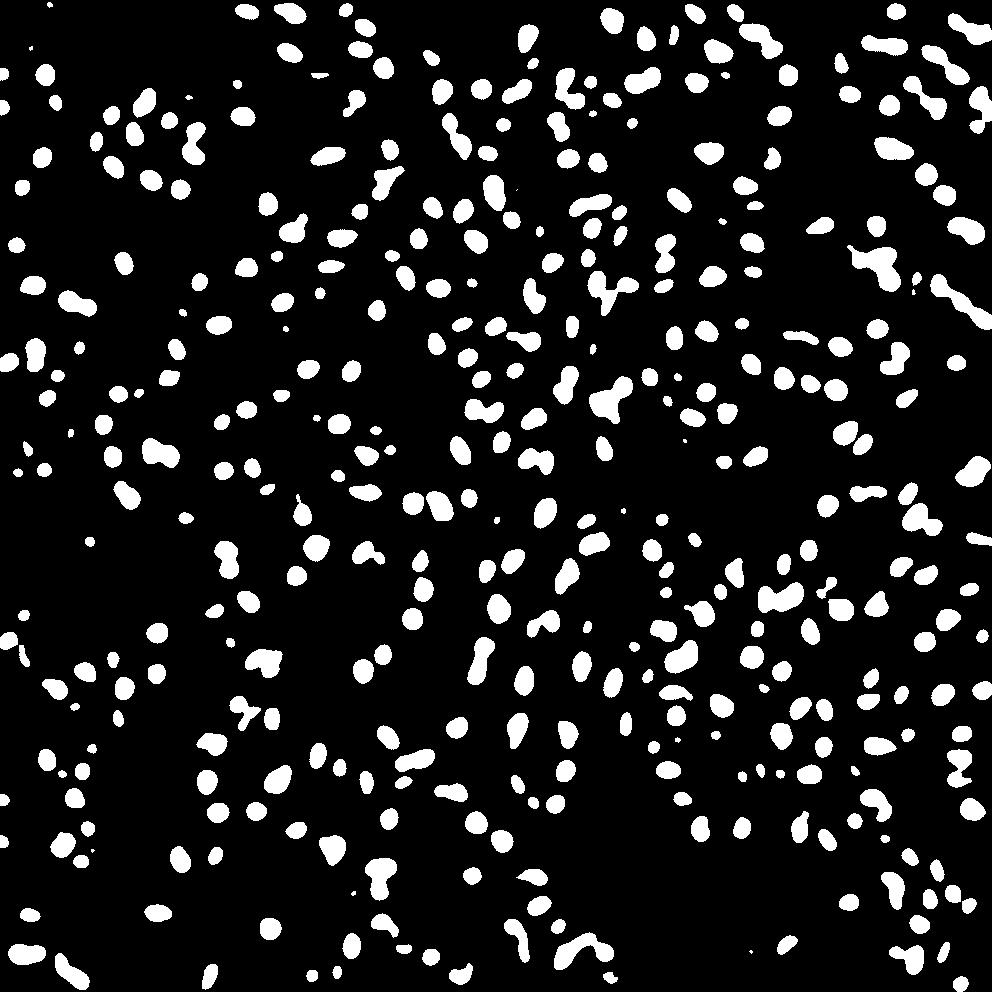

Image 1(Actual)


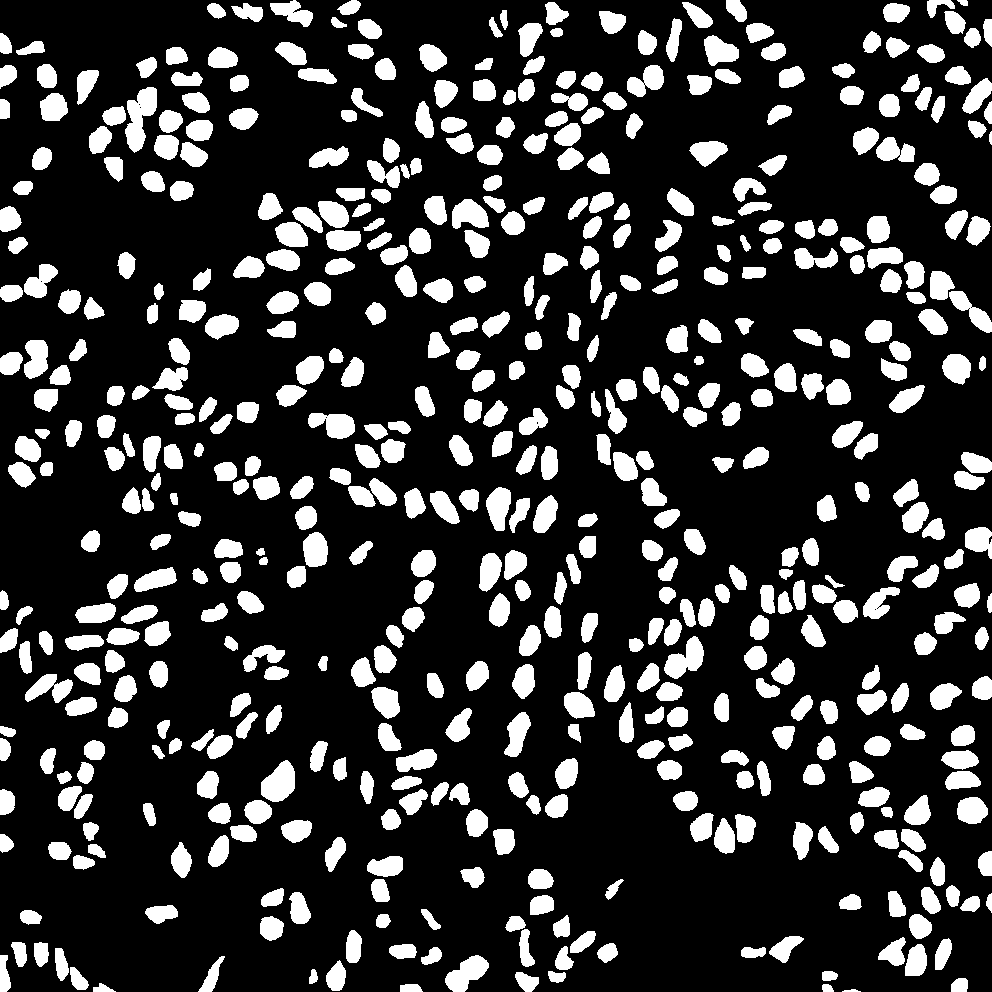

In [ ]:
iter=2 #Two prediction iteration
padwidth=8 #Padwidth to reduce image size
crop_length=2*padwidth #Cropwidth is twice pasdwidth
img_pred=np.empty((iter,M-crop_length,M-crop_length)).astype(int) #Empty prediction array
img_act=np.empty((iter,M-crop_length,M-crop_length)).astype(int) #Empty image array
y_pred=model.predict(xtest[0:iter,:,:,:]) #Save the predicted results
#Since predicted results is in float format in 0 to 1 range. Threshold ito 0 and 1
for i in range(iter):
  #Iterate over each predicted image
  tmp_img=y_pred[i,:,:,0] 
  tmp_img[tmp_img>0.5]=255 #Above 0.5 is 255
  tmp_img[tmp_img<=0.5]=0 #Blow 0.5 is 0
  tmp_img=tmp_img.astype(int)[padwidth:-padwidth,padwidth:-padwidth]#Type cast to integer and crop the predicted image
  img_pred[i,:,:]=tmp_img

  img_act[i,:,:]=(np.array(ybtest[i,:,:])*255).astype(int)[padwidth:-padwidth,padwidth:-padwidth] #Type cast to integer and crop the actual image

#print results
print("Image 1(Prediction)")
cv2_imshow(img_pred[0,:,:])
print("Image 1(Actual)")
cv2_imshow(img_act[0,:,:])

(iI) Larger kernel for convolution
Due to memory limitations, the the channels in each layers were halfed and and a larger kernel size(7x7) was used for upstream and downstream layers. Increasing the kernel size resulted in more connected cells than individual cells. Lower kernel size(3x3) yielded beter size

In [ ]:
M=1008 #Pixel size of image
F=20 #Channels in the first layer. Channels doubles every layer
initializer='he_normal' #Default kernal initialisation algorithm
#--------------------------------------------------------------------------------------------------------------------
x_input = tf.keras.layers.Input(shape =(M,M, 3)) #Input layer defined with size of image
#------------------------------Downstream Path-1----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_1 = tf.keras.layers.Conv2D(F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(x_input)
conv_1 = tf.keras.layers.Conv2D(F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(conv_1)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1) #Batch Normalisation layer
pool_1 = tf.keras.layers.MaxPooling2D((2, 2))(conv_1) #Maxpool layer reduces feature set by 4
#------------------------------Downstream Path-2----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_2 = tf.keras.layers.Conv2D(2*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(pool_1)
conv_2 = tf.keras.layers.Conv2D(2*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(conv_2)
#conv_2 = tf.keras.layers.BatchNormalization()(conv_2) #Batch Normalisation layer
pool_2 = tf.keras.layers.MaxPooling2D((2, 2))(conv_2) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-3---------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_3 = tf.keras.layers.Conv2D(4*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(pool_2)
conv_3 = tf.keras.layers.Conv2D(4*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(conv_3)
conv_3 = tf.keras.layers.BatchNormalization()(conv_3) #Batch Normalisation layer
pool_3 = tf.keras.layers.MaxPooling2D((2, 2))(conv_3) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-4----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_4 = tf.keras.layers.Conv2D(8*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(pool_3)
conv_4 = tf.keras.layers.Conv2D(8*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(conv_4)
#conv_4 = tf.keras.layers.BatchNormalization()(conv_4) #Batch Normalisation layer
pool_4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_4) #Maxpool layer reduces feature set by 4
 #------------------------------Bottleneck-----------------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_5 = tf.keras.layers.Conv2D(16*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(pool_4)
conv_5 = tf.keras.layers.Conv2D(16*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(conv_5)
conv_5 = tf.keras.layers.BatchNormalization()(conv_5) #Batch Normalisation layer
#------------------------------Upstream Path-1------------------------------------------------------------------------
#Upsampling image
uconv_6 = tf.keras.layers.Conv2DTranspose(32*F, (2, 2), strides=(2, 2), padding='same')(conv_5)
uconv_6 = tf.keras.layers.concatenate([uconv_6, conv_4]) #Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_6 = tf.keras.layers.Conv2D(8*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_6)
conv_6 = tf.keras.layers.Conv2D(8*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_6)
#conv_6 = tf.keras.layers.BatchNormalization()(conv_6) #Batch Normalisation layer
 #------------------------------Upstream Path-2------------------------------------------------------------------------
#Upsampling image
uconv_7 = tf.keras.layers.Conv2DTranspose(4*F, (2, 2), strides=(2, 2), padding='same')(conv_6)
uconv_7 = tf.keras.layers.concatenate([uconv_7, conv_3])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_7 = tf.keras.layers.Conv2D(4*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_7)
conv_7 = tf.keras.layers.Conv2D(4*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_7)
conv_7 = tf.keras.layers.BatchNormalization()(conv_7) #Batch Normalisation layer
#------------------------------Upstream Path-3------------------------------------------------------------------------
#Upsampling image
uconv_8 = tf.keras.layers.Conv2DTranspose(2*F, (2, 2), strides=(2, 2), padding='same')(conv_7)
uconv_8 = tf.keras.layers.concatenate([uconv_8, conv_2])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_8 = tf.keras.layers.Conv2D(2*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_8)
conv_8 = tf.keras.layers.Conv2D(2*F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_8)
#conv_8 = tf.keras.layers.BatchNormalization()(conv_8) #Batch Normalisation layer
#------------------------------Upstream Path-4------------------------------------------------------------------------
#Upsampling image
uconv_9 = tf.keras.layers.Conv2DTranspose(F, (2, 2), strides=(2, 2), padding='same')(conv_8)
uconv_9 = tf.keras.layers.concatenate([uconv_9, conv_1], axis=3)#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_9 = tf.keras.layers.Conv2D(F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_9)
conv_9 = tf.keras.layers.Conv2D(F, (7,7), activation='relu', kernel_initializer=initializer, padding='same')(uconv_9)
conv_9 = tf.keras.layers.BatchNormalization()(conv_9) #Batch Normalisation layer
 #------------------------------Output------------------------------------------------------------------------------
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(conv_9)
 
model = tf.keras.Model(inputs=[x_input], outputs=[outputs]) #generating model from layer
print(model.summary()) #Print model summary
model.compile(optimizer='adam', loss=DiceLoss,metrics=[diceScore]) #Compiling model(Set optimiser, Loss function, Performance Matrix)
history=model.fit(xtrain, ybtrain, batch_size=4, epochs=20, verbose=1, shuffle=True,validation_split=0.2) #Train model

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 1008, 1008,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_65 (Conv2D)             (None, 1008, 1008,   2960        ['input_4[0][0]']                
                                20)                                                               
                                                                                                  
 conv2d_66 (Conv2D)             (None, 1008, 1008,   19620       ['conv2d_65[0][0]']              
                                20)                                                         

1/1 [==============================] - 1s 895ms/step
Image 1(Prediction)


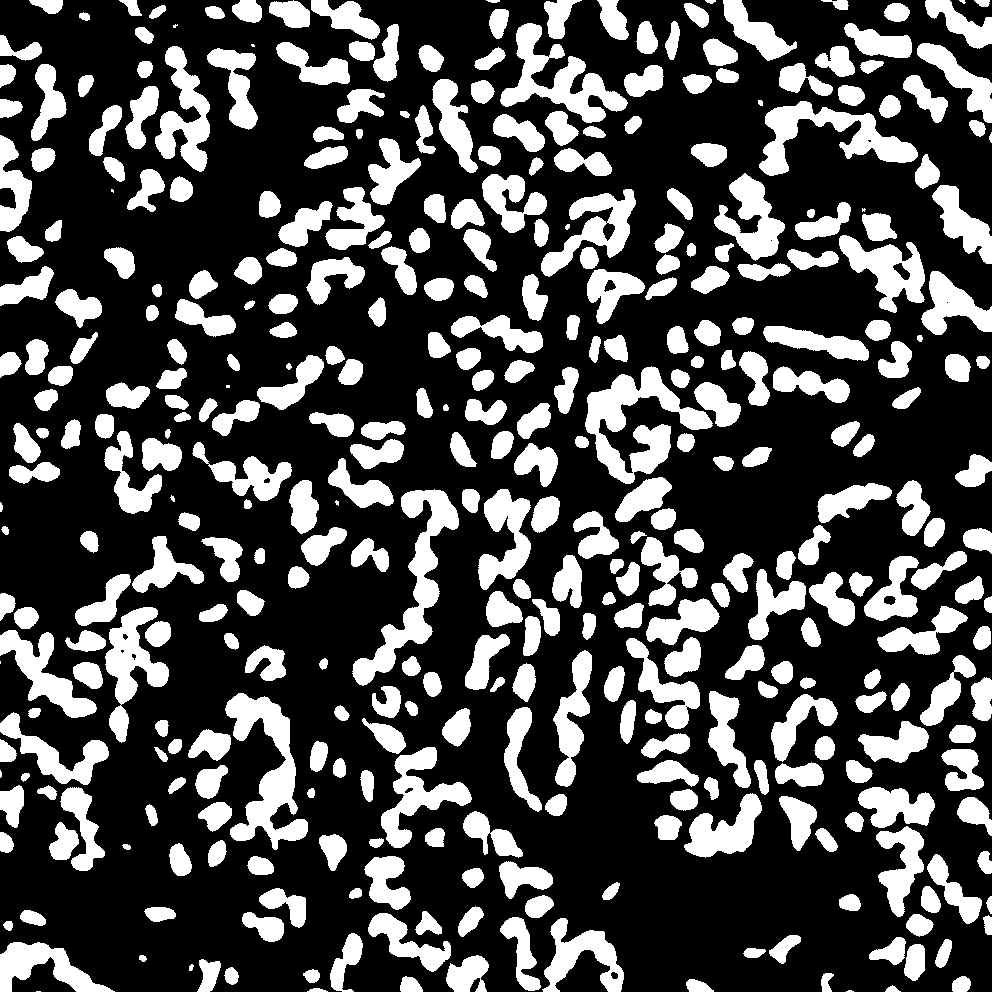

Image 1(Actual)


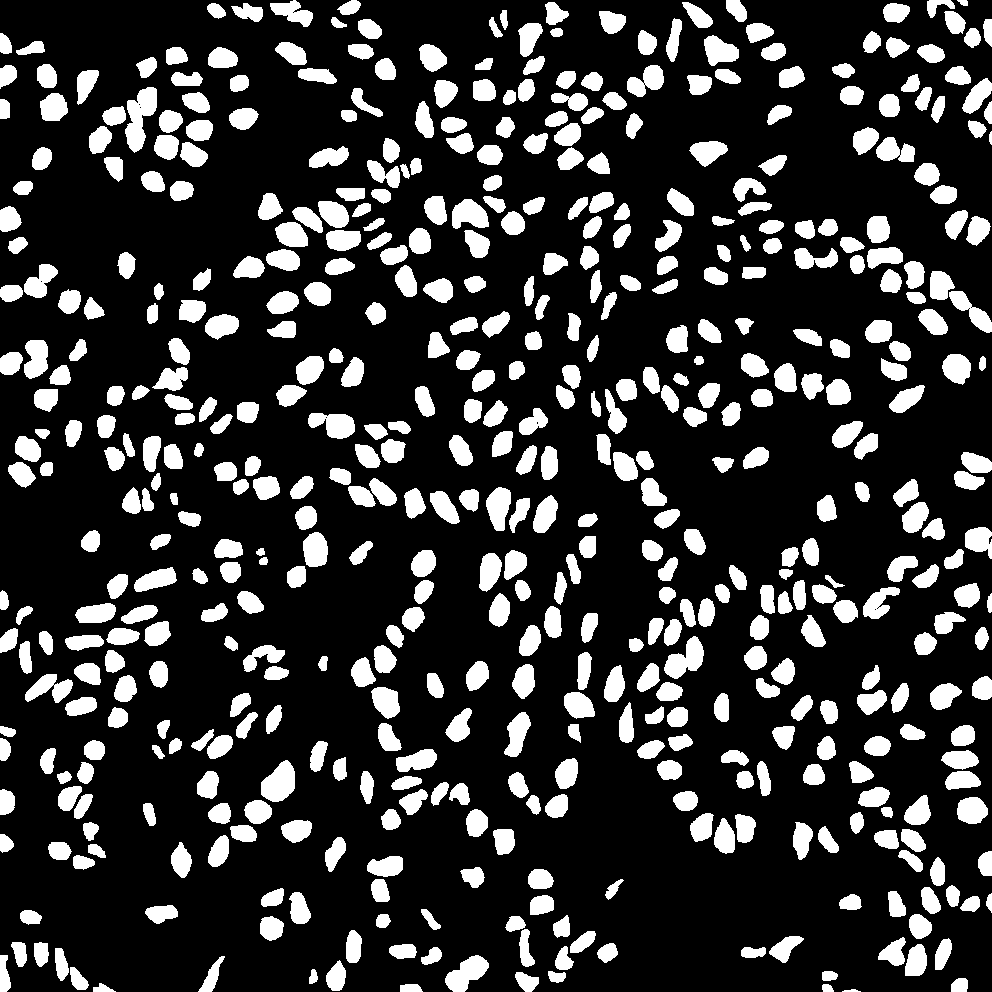

In [ ]:
iter=2 #Two prediction iteration
padwidth=8 #Padwidth to reduce image size
crop_length=2*padwidth #Cropwidth is twice pasdwidth
img_pred=np.empty((iter,M-crop_length,M-crop_length)).astype(int) #Empty prediction array
img_act=np.empty((iter,M-crop_length,M-crop_length)).astype(int) #Empty image array
y_pred=model.predict(xtest[0:iter,:,:,:]) #Save the predicted results
#Since predicted results is in float format in 0 to 1 range. Threshold ito 0 and 1
for i in range(iter):
  #Iterate over each predicted image
  tmp_img=y_pred[i,:,:,0] 
  tmp_img[tmp_img>0.5]=255 #Above 0.5 is 255
  tmp_img[tmp_img<=0.5]=0 #Blow 0.5 is 0
  tmp_img=tmp_img.astype(int)[padwidth:-padwidth,padwidth:-padwidth]#Type cast to integer and crop the predicted image
  img_pred[i,:,:]=tmp_img

  img_act[i,:,:]=(np.array(ybtest[i,:,:])*255).astype(int)[padwidth:-padwidth,padwidth:-padwidth] #Type cast to integer and crop the actual image

#print results
print("Image 1(Prediction)")
cv2_imshow(img_pred[0,:,:])
print("Image 1(Actual)")
cv2_imshow(img_act[0,:,:])

 5.b) Number of filters per layer in the UNet architecture

In the initial architecture in Q2, the number of the features used in first layer is 40. The features doubles downstream. here the number of features is reduced by a fctor of 4.Feature in the first layer is 10. With reduced number of features the UNet architecture outputsis a mask with cells appearing as heavily interconnected blobs with poor distinction nd segmentation

In [ ]:
M=1008 #Pixel size of image
F=10 #Channels in the first layer. Channels doubles every layer
initializer='he_normal' #Default kernal initialisation algorithm
#--------------------------------------------------------------------------------------------------------------------
x_input = tf.keras.layers.Input(shape =(M,M, 3)) #Input layer defined with size of image
#------------------------------Downstream Path-1----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(x_input)
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_1)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1) #Batch Normalisation layer
pool_1 = tf.keras.layers.MaxPooling2D((2, 2))(conv_1) #Maxpool layer reduces feature set by 4
#------------------------------Downstream Path-2----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_1)
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_2)
conv_2 = tf.keras.layers.BatchNormalization()(conv_2) #Batch Normalisation layer
pool_2 = tf.keras.layers.MaxPooling2D((2, 2))(conv_2) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-3---------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_2)
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_3)
conv_3 = tf.keras.layers.BatchNormalization()(conv_3) #Batch Normalisation layer
pool_3 = tf.keras.layers.MaxPooling2D((2, 2))(conv_3) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-4----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_3)
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_4)
conv_4 = tf.keras.layers.BatchNormalization()(conv_4) #Batch Normalisation layer
pool_4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_4) #Maxpool layer reduces feature set by 4
 #------------------------------Bottleneck-----------------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_4)
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_5)
conv_5 = tf.keras.layers.BatchNormalization()(conv_5) #Batch Normalisation layer
#------------------------------Upstream Path-1------------------------------------------------------------------------
#Upsampling image
uconv_6 = tf.keras.layers.Conv2DTranspose(32*F, (2, 2), strides=(2, 2), padding='same')(conv_5)
uconv_6 = tf.keras.layers.concatenate([uconv_6, conv_4]) #Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_6)
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_6)
conv_6 = tf.keras.layers.BatchNormalization()(conv_6) #Batch Normalisation layer
 #------------------------------Upstream Path-2------------------------------------------------------------------------
#Upsampling image
uconv_7 = tf.keras.layers.Conv2DTranspose(4*F, (2, 2), strides=(2, 2), padding='same')(conv_6)
uconv_7 = tf.keras.layers.concatenate([uconv_7, conv_3])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_7)
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_7)
conv_7 = tf.keras.layers.BatchNormalization()(conv_7) #Batch Normalisation layer
#------------------------------Upstream Path-3------------------------------------------------------------------------
#Upsampling image
uconv_8 = tf.keras.layers.Conv2DTranspose(2*F, (2, 2), strides=(2, 2), padding='same')(conv_7)
uconv_8 = tf.keras.layers.concatenate([uconv_8, conv_2])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_8)
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_8)
conv_8 = tf.keras.layers.BatchNormalization()(conv_8) #Batch Normalisation layer
#------------------------------Upstream Path-4------------------------------------------------------------------------
#Upsampling image
uconv_9 = tf.keras.layers.Conv2DTranspose(F, (2, 2), strides=(2, 2), padding='same')(conv_8)
uconv_9 = tf.keras.layers.concatenate([uconv_9, conv_1], axis=3)#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_9)
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_9)
conv_9 = tf.keras.layers.BatchNormalization()(conv_9) #Batch Normalisation layer
 #------------------------------Output------------------------------------------------------------------------------
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(conv_9)
 
model = tf.keras.Model(inputs=[x_input], outputs=[outputs]) #generating model from layer
print(model.summary()) #Print model summary
model.compile(optimizer='adam', loss=DiceLoss,metrics=[diceScore]) #Compiling model(Set optimiser, Loss function, Performance Matrix)
history=model.fit(xtrain, ybtrain, batch_size=4, epochs=20, verbose=1, shuffle=True,validation_split=0.2) #Train model

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 1008, 1008,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, 1008, 1008,   280         ['input_1[0][0]']                
                                10)                                                               
                                                                                                  
 conv2d_1 (Conv2D)              (None, 1008, 1008,   910         ['conv2d[0][0]']                 
                                10)                                                           

1/1 [==============================] - 0s 315ms/step
Image 1(Prediction)


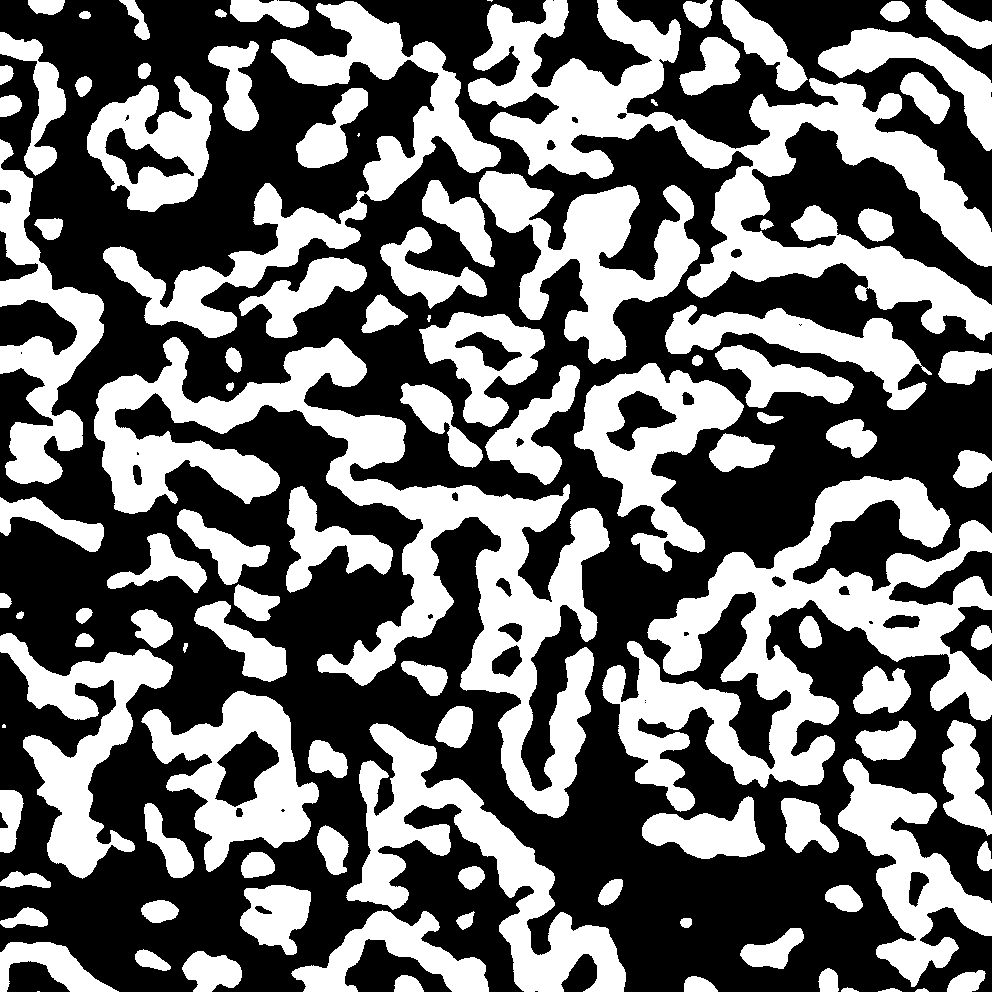

Image 1(Actual)


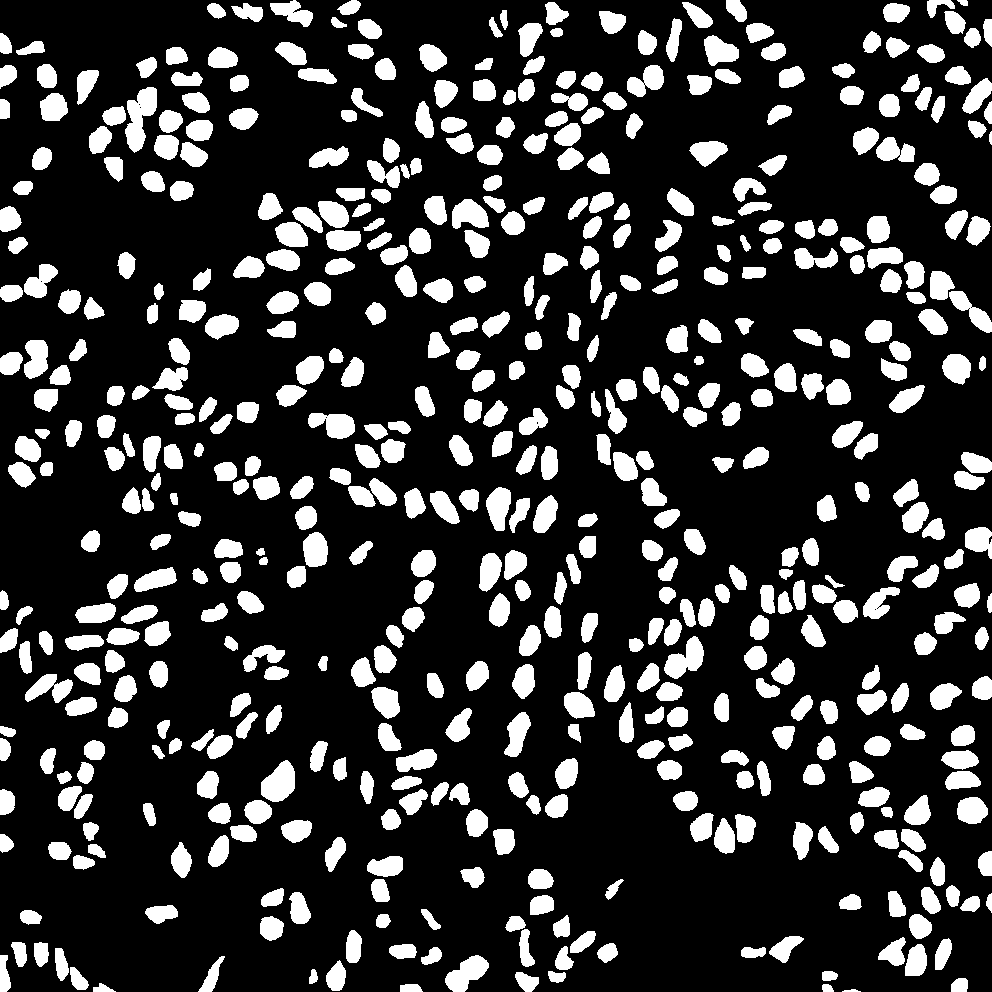

In [ ]:
iter=2 #Two prediction iteration
padwidth=8 #Padwidth to reduce image size
crop_length=2*padwidth #Cropwidth is twice pasdwidth
img_pred=np.empty((iter,M-crop_length,M-crop_length)).astype(int) #Empty prediction array
img_act=np.empty((iter,M-crop_length,M-crop_length)).astype(int) #Empty image array
y_pred=model.predict(xtest[0:iter,:,:,:]) #Save the predicted results
#Since predicted results is in float format in 0 to 1 range. Threshold ito 0 and 1
for i in range(iter):
  #Iterate over each predicted image
  tmp_img=y_pred[i,:,:,0] 
  tmp_img[tmp_img>0.5]=255 #Above 0.5 is 255
  tmp_img[tmp_img<=0.5]=0 #Blow 0.5 is 0
  tmp_img=tmp_img.astype(int)[padwidth:-padwidth,padwidth:-padwidth]#Type cast to integer and crop the predicted image
  img_pred[i,:,:]=tmp_img

  img_act[i,:,:]=(np.array(ybtest[i,:,:])*255).astype(int)[padwidth:-padwidth,padwidth:-padwidth] #Type cast to integer and crop the actual image

#print results
print("Image 1(Prediction)")
cv2_imshow(img_pred[0,:,:])
print("Image 1(Actual)")
cv2_imshow(img_act[0,:,:])

5.c) Loss function as a combination of Dice and MS-SSIM with a trade-off parameter 

In [ ]:
M=1008 #Pixel size of image
F=10 #Channels in the first layer. Channels doubles every layer
initializer='he_normal' #Default kernal initialisation algorithm
#--------------------------------------------------------------------------------------------------------------------
x_input = tf.keras.layers.Input(shape =(M,M, 3)) #Input layer defined with size of image
#------------------------------Downstream Path-1----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(x_input)
conv_1 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_1)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1) #Batch Normalisation layer
pool_1 = tf.keras.layers.MaxPooling2D((2, 2))(conv_1) #Maxpool layer reduces feature set by 4
#------------------------------Downstream Path-2----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_1)
conv_2 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_2)
conv_2 = tf.keras.layers.BatchNormalization()(conv_2) #Batch Normalisation layer
pool_2 = tf.keras.layers.MaxPooling2D((2, 2))(conv_2) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-3---------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_2)
conv_3 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_3)
conv_3 = tf.keras.layers.BatchNormalization()(conv_3) #Batch Normalisation layer
pool_3 = tf.keras.layers.MaxPooling2D((2, 2))(conv_3) #Maxpool layer reduces feature set by 4
 #------------------------------Downstream Path-4----------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_3)
conv_4 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_4)
conv_4 = tf.keras.layers.BatchNormalization()(conv_4) #Batch Normalisation layer
pool_4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_4) #Maxpool layer reduces feature set by 4
 #------------------------------Bottleneck-----------------------------------------------------------------------------
#Convolution layer with 3x3 kernel & ReLU activation
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(pool_4)
conv_5 = tf.keras.layers.Conv2D(16*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_5)
conv_5 = tf.keras.layers.BatchNormalization()(conv_5) #Batch Normalisation layer
#------------------------------Upstream Path-1------------------------------------------------------------------------
#Upsampling image
uconv_6 = tf.keras.layers.Conv2DTranspose(32*F, (2, 2), strides=(2, 2), padding='same')(conv_5)
uconv_6 = tf.keras.layers.concatenate([uconv_6, conv_4]) #Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_6)
conv_6 = tf.keras.layers.Conv2D(8*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_6)
conv_6 = tf.keras.layers.BatchNormalization()(conv_6) #Batch Normalisation layer
 #------------------------------Upstream Path-2------------------------------------------------------------------------
#Upsampling image
uconv_7 = tf.keras.layers.Conv2DTranspose(4*F, (2, 2), strides=(2, 2), padding='same')(conv_6)
uconv_7 = tf.keras.layers.concatenate([uconv_7, conv_3])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_7)
conv_7 = tf.keras.layers.Conv2D(4*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_7)
conv_7 = tf.keras.layers.BatchNormalization()(conv_7) #Batch Normalisation layer
#------------------------------Upstream Path-3------------------------------------------------------------------------
#Upsampling image
uconv_8 = tf.keras.layers.Conv2DTranspose(2*F, (2, 2), strides=(2, 2), padding='same')(conv_7)
uconv_8 = tf.keras.layers.concatenate([uconv_8, conv_2])#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_8)
conv_8 = tf.keras.layers.Conv2D(2*F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_8)
conv_8 = tf.keras.layers.BatchNormalization()(conv_8) #Batch Normalisation layer
#------------------------------Upstream Path-4------------------------------------------------------------------------
#Upsampling image
uconv_9 = tf.keras.layers.Conv2DTranspose(F, (2, 2), strides=(2, 2), padding='same')(conv_8)
uconv_9 = tf.keras.layers.concatenate([uconv_9, conv_1], axis=3)#Skip connection layer
#Convolution layer with 3x3 kernel & ReLU activation
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(uconv_9)
conv_9 = tf.keras.layers.Conv2D(F, (3,3), activation='relu', kernel_initializer=initializer, padding='same')(conv_9)
conv_9 = tf.keras.layers.BatchNormalization()(conv_9) #Batch Normalisation layer
 #------------------------------Output------------------------------------------------------------------------------
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(conv_9)
 
model = tf.keras.Model(inputs=[x_input], outputs=[outputs]) #generating model from layer
print(model.summary()) #Print model summary
model.compile(optimizer='adam', loss=diceMSSIM, metrics=[diceScore])
history=model.fit(xtrain, ybtrain, batch_size=4, epochs=20, verbose=1, shuffle=True,validation_split=0.2) #Train model

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 1008, 1008,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_285 (Conv2D)            (None, 1008, 1008,   280         ['input_16[0][0]']               
                                10)                                                               
                                                                                                  
 conv2d_286 (Conv2D)            (None, 1008, 1008,   910         ['conv2d_285[0][0]']             
                                10)                                                        

InvalidArgumentError: ignored

Merging SSIM loss with Dice Loss is resulting in error during model compilation. The model compilation could not be carried with DiceLoss and MS-SSIM loss

6)

**Watershed segmentation on the probability map produced by the UNet**

1/1 [==============================] - 0s 32ms/step


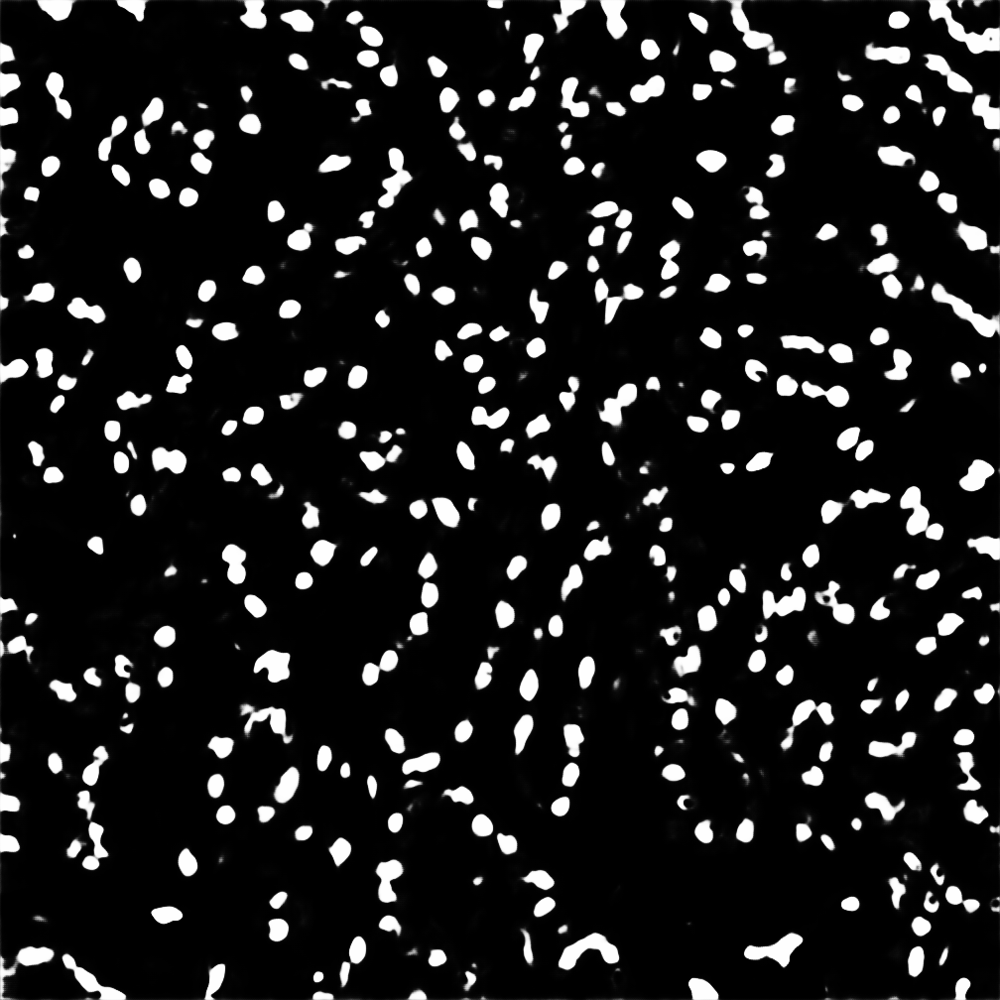

In [ ]:
#Display the probability map output by first model (Model A)
y_pred=modelA.predict(xtest[0:iter,:,:,:])
img_gray=y_pred[0,:,:,0]*255
img_gray=img_gray.astype('uint8')
cv2_imshow(img_gray)

In [ ]:
#import libraries
import cv2
import numpy as np
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow   #cv2_imshow to display the image

In [ ]:
def watershed_algorithm(img_watershed,thresh=127):
  #gray_scale = cv2.cvtColor(img_watershed, cv2.COLOR_BGR2GRAY)       #converts the image to binary
  gray_scale = img_watershed
  _,threshold = cv2.threshold(gray_scale, thresh, 255, cv2.THRESH_BINARY_INV)   #taking binary inverse of the image which will make the pixels = 0 ( which are greater than threshold) or 1 for others
  print ('Image taken as input for watershed segmentation')
  cv2_imshow(img_watershed)
  print ('Image after inverse binary thresholding:')
  cv2_imshow(threshold)

 #calculate distance transform
  distance_transform = ndi.distance_transform_edt(threshold)       #calculates exact Euclidean distance transform
  dist_visual = distance_transform.copy()
  print('Distance transform of image')
  cv2_imshow (dist_visual)
  
  #local maximum calculation
  local_maximum = peak_local_max(distance_transform, indices=False, min_distance=20, labels=threshold)         #finds local maxima of points
  markers = ndi.label(local_maximum, structure=np.ones((3,3)))[0]     #labeling the local maximums of the image   
  #inverting the distance transfrom to make local minima for watershed segmentation input
  labels = watershed(-distance_transform, markers, mask=threshold)    #applying watershed segmetation
  #print('Watershed Segmented Image')
  plt.title('Watershed Segmented Image')
  plt.imshow(labels, cmap="jet")

  return 

#reference:https://felipemeganha.medium.com/image-segmentation-with-watershed-using-python-f40f2f7e9f40

Watershedding on the initial UNet architecture output

Image taken as input for watershed segmentation


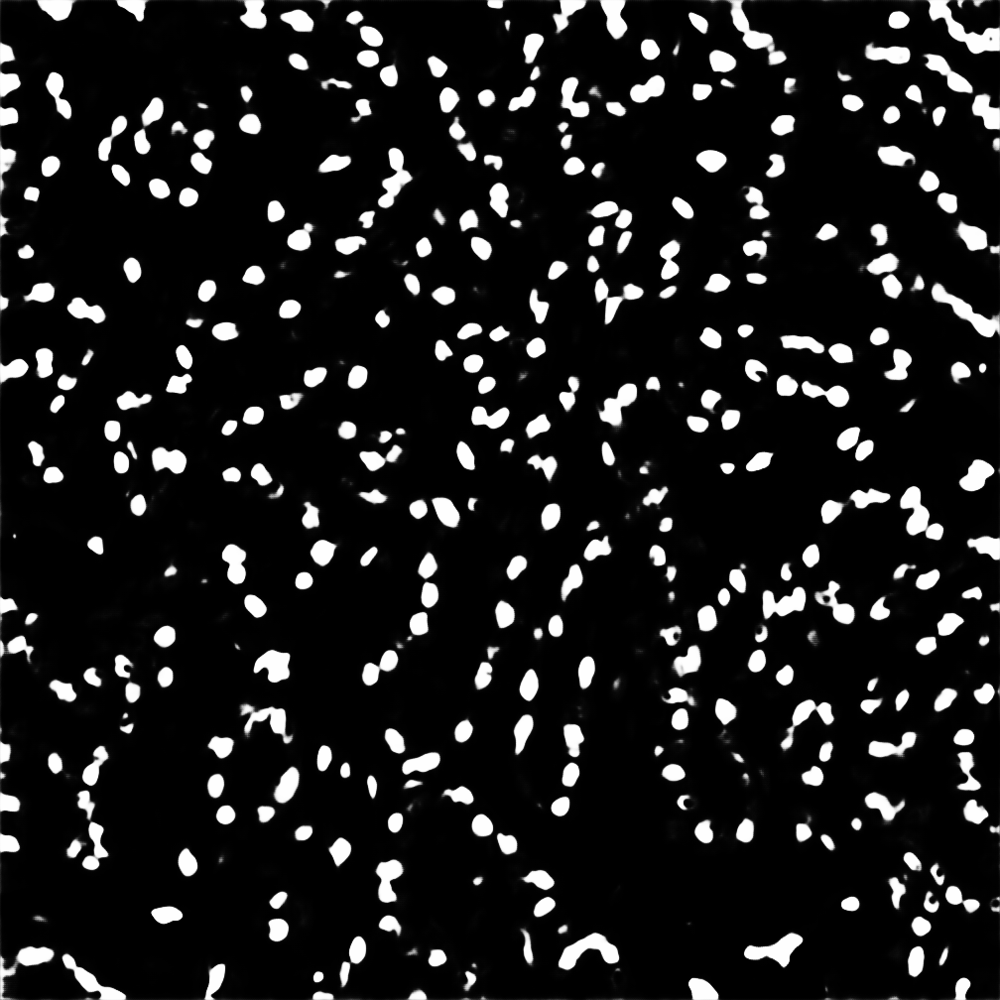

Image after inverse binary thresholding:


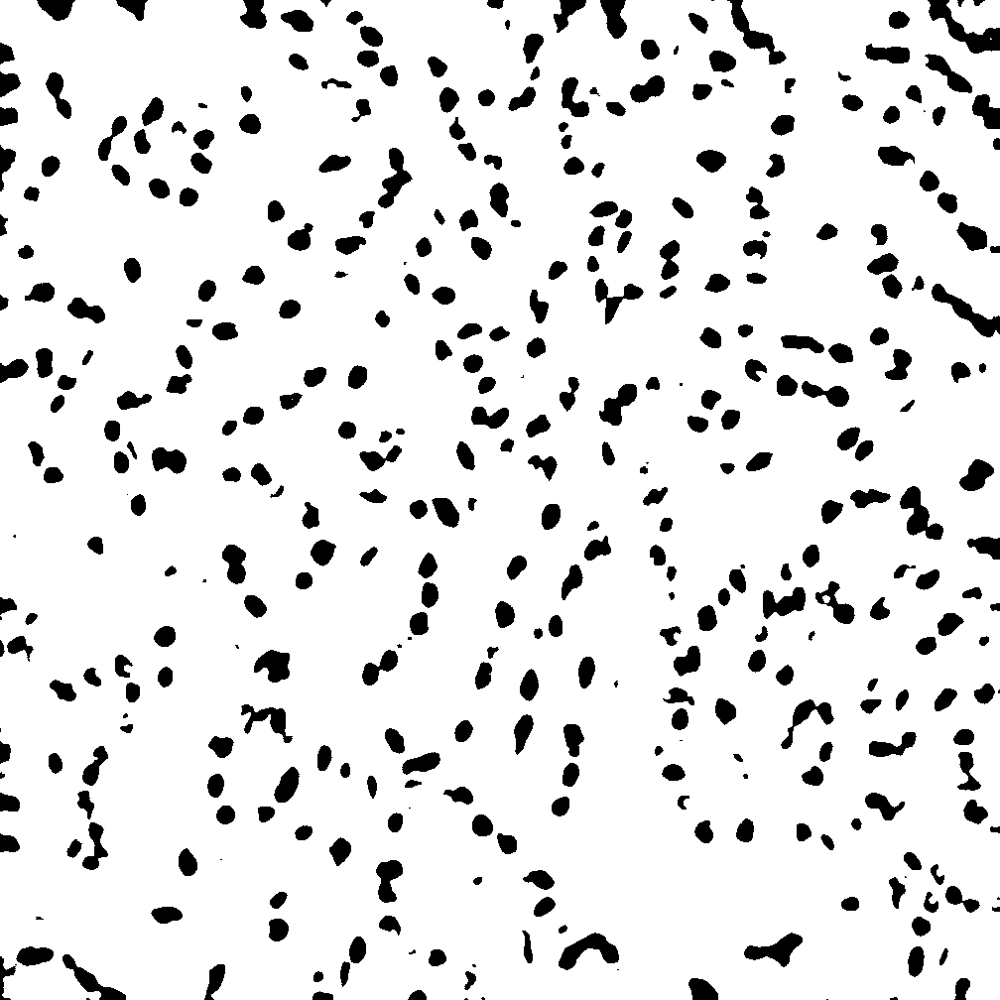

Distance transform of image


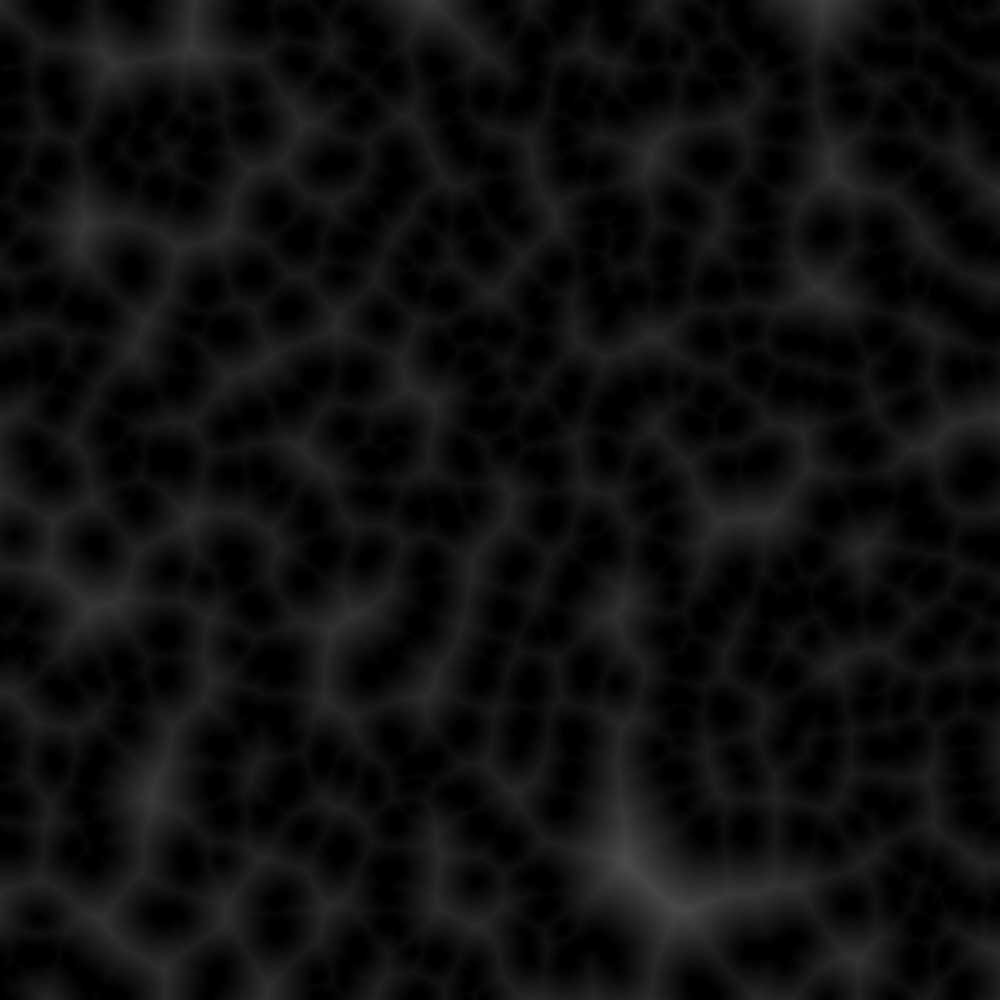

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.


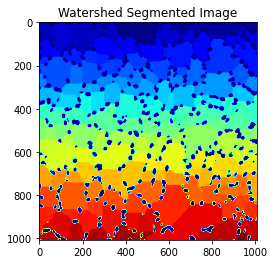

In [ ]:
img_watershed=img_gray
watershed_algorithm(img_watershed) #Apply watershed algorithm on image

Watershedding with larger threshold, resulted in removal of small cluster from final output

Image taken as input for watershed segmentation


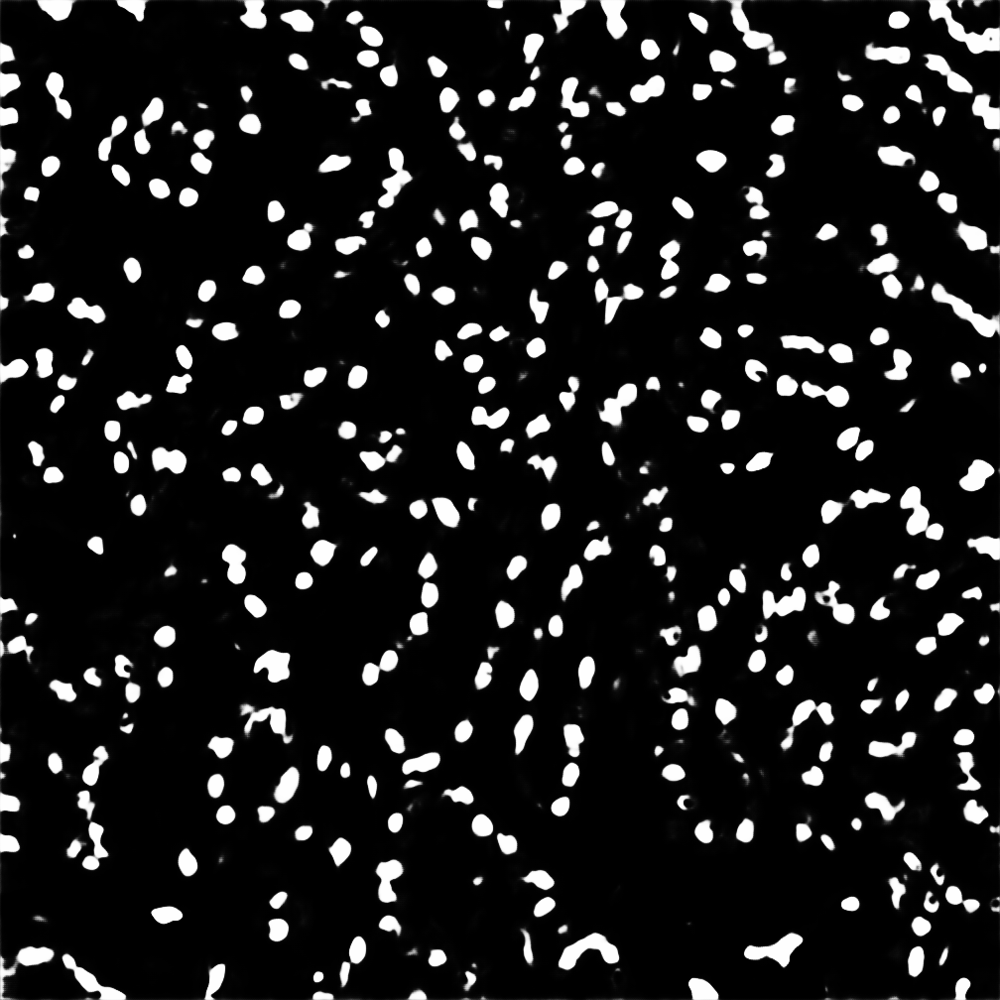

Image after inverse binary thresholding:


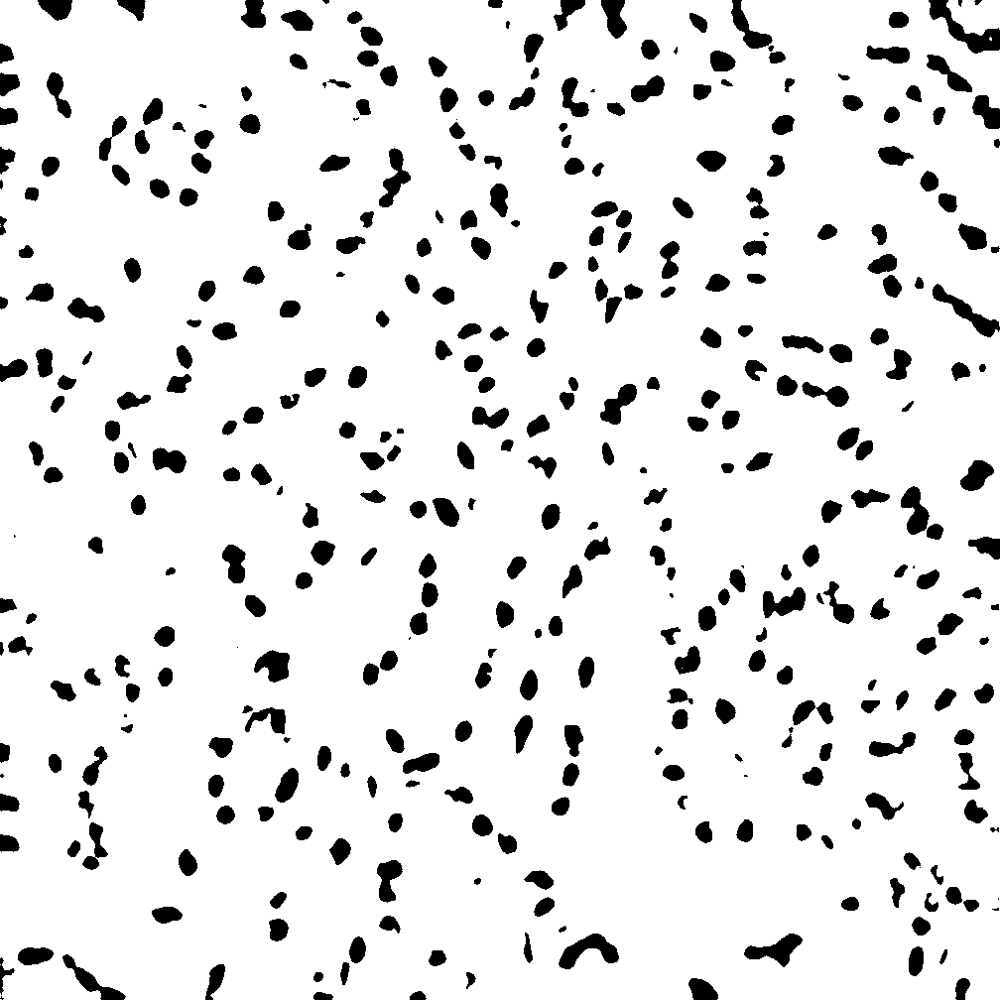

Distance transform of image


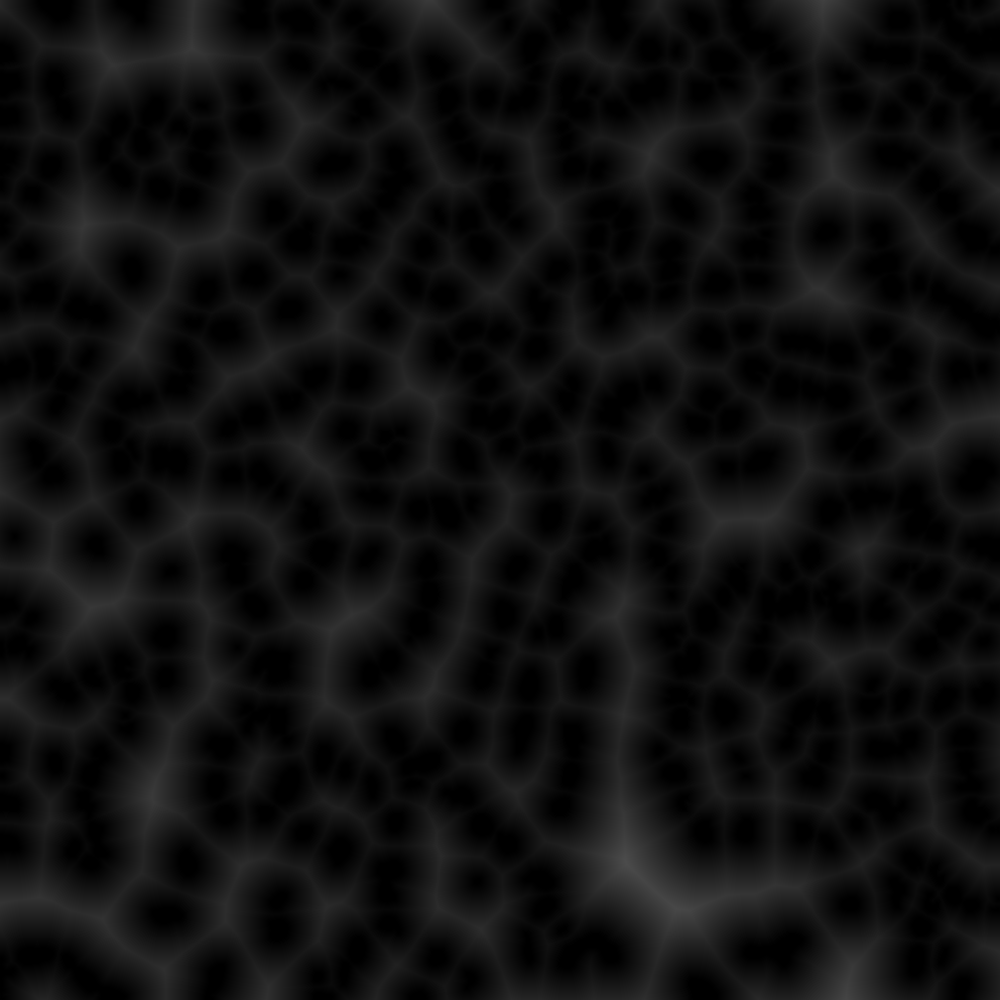

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.


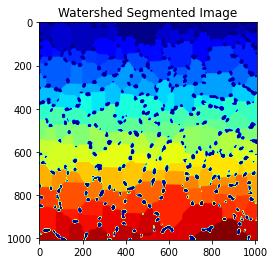

In [ ]:
img_watershed=img_gray
watershed_algorithm(img_watershed,thresh=200) #Apply watershed algorithm on image

Other references:
- Documentation: Keras, Scipy , OpenCV, SciKit Image
- https://towardsdatascience.com/medical-images-segmentation-using-keras-7dc3be5a8524
- https://stackoverflow.com/
- https://towardsdatascience.com/batch-normalisation-in-deep-neural-network-ce65dd9e8dbf#:~:text=Batch%20normalization%20is%20a%20technique,to%20train%20deep%20neural%20networks.
- https://www.analyticsvidhya.com/blog/2022/07/brain-mri-segmentation-with-0-95-dice-score/
